In [1]:
import os            # file operations
import requests      # networking
from pathlib import Path
import zipfile
import io

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from pyspark.sql.functions import when
#import pyspark_dist_explore as pde
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pyspark.sql.functions as fn

In [3]:
from pyspark import SparkConf, SparkContext

conf = SparkConf().setAppName("Projet_Taxi")
sc = SparkContext(conf=conf)

In [4]:
!pip install geojson geopandas plotly

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [5]:
!pip install ipyleaflet

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


Downloads datasets:

In [4]:
yellow_taxi_files = ['2019-01', '2019-04', '2020-01', '2020-04', '2021-01', '2021-04', '2022-01', '2022-04']

In [5]:
path_data = './'
for name in yellow_taxi_files:
    filename = 'yellow_tripdata_'+name+'.parquet'
    if os.path.exists(os.path.join(path_data, filename)):
        print('The file %s already exists.' % os.path.join(path_data, filename))
    else:
        file_url = "https://d37ci6vzurychx.cloudfront.net/trip-data/yellow_tripdata_"+name+".parquet"
        r = requests.get(file_url)
        with open(os.path.join(path_data, filename), 'wb') as f:
            f.write(r.content)
        print('Downloaded file %s.' % os.path.join(path_data, filename))

The file ./yellow_tripdata_2019-01.parquet already exists.
The file ./yellow_tripdata_2019-04.parquet already exists.
The file ./yellow_tripdata_2020-01.parquet already exists.
The file ./yellow_tripdata_2020-04.parquet already exists.
The file ./yellow_tripdata_2021-01.parquet already exists.
The file ./yellow_tripdata_2021-04.parquet already exists.
The file ./yellow_tripdata_2022-01.parquet already exists.
The file ./yellow_tripdata_2022-04.parquet already exists.


In [6]:
fhv_taxi_files = ['2019-01', '2019-04', '2020-01', '2020-04', '2021-01', '2021-04', '2022-01', '2022-04']

In [7]:
path_data = './'
for name in fhv_taxi_files:
    filename = 'fhv_tripdata_'+name+'.parquet'
    if os.path.exists(os.path.join(path_data, filename)):
        print('The file %s already exists.' % os.path.join(path_data, filename))
    else:
        file_url = "https://d37ci6vzurychx.cloudfront.net/trip-data/fhv_tripdata_"+name+".parquet"
        r = requests.get(file_url)
        with open(os.path.join(path_data, filename), 'wb') as f:
            f.write(r.content)
        print('Downloaded file %s.' % os.path.join(path_data, filename))

The file ./fhv_tripdata_2019-01.parquet already exists.
The file ./fhv_tripdata_2019-04.parquet already exists.
The file ./fhv_tripdata_2020-01.parquet already exists.
The file ./fhv_tripdata_2020-04.parquet already exists.
The file ./fhv_tripdata_2021-01.parquet already exists.
The file ./fhv_tripdata_2021-04.parquet already exists.
The file ./fhv_tripdata_2022-01.parquet already exists.
The file ./fhv_tripdata_2022-04.parquet already exists.


In [8]:
from pyspark.sql import SparkSession

In [9]:
spark = (SparkSession
    .builder
    .appName("Projet Taxi")
    .config("spark.executor.memory", "4g") 
    .config("spark.driver.memory", "4g") 
    .config("spark.driver.maxResultSize", "4g")      
    .getOrCreate()
)

Read files:

In [10]:
dfJaune12019 = spark.read.parquet("./yellow_tripdata_2019-01.parquet")
dfJaune12020 = spark.read.parquet("./yellow_tripdata_2020-01.parquet")
dfJaune12021 = spark.read.parquet("./yellow_tripdata_2021-01.parquet")
dfJaune12022 = spark.read.parquet("./yellow_tripdata_2022-01.parquet")

In [11]:
dfJaune42019 = spark.read.parquet("./yellow_tripdata_2019-04.parquet")
dfJaune42020 = spark.read.parquet("./yellow_tripdata_2020-04.parquet")
dfJaune42021 = spark.read.parquet("./yellow_tripdata_2021-04.parquet")
dfJaune42022 = spark.read.parquet("./yellow_tripdata_2022-04.parquet")

In [12]:
dffhv12019 = spark.read.parquet("./fhv_tripdata_2019-01.parquet")
dffhv12020 = spark.read.parquet("./fhv_tripdata_2020-01.parquet")
dffhv12021 = spark.read.parquet("./fhv_tripdata_2021-01.parquet")
dffhv12022 = spark.read.parquet("./fhv_tripdata_2022-01.parquet")

In [13]:
dffhv42019 = spark.read.parquet("./fhv_tripdata_2019-04.parquet")
dffhv42020 = spark.read.parquet("./fhv_tripdata_2020-04.parquet")
dffhv42021 = spark.read.parquet("./fhv_tripdata_2021-04.parquet")
dffhv42022 = spark.read.parquet("./fhv_tripdata_2022-04.parquet")

The number of partitions of some dataframe:

In [14]:
print("Nombre de partitions de DF : dfJaune12019 est: ", dfJaune12019.rdd.getNumPartitions())
print("Nombre de partitions de DF : dffhv42022 est: ", dffhv42022.rdd.getNumPartitions())

Nombre de partitions de DF : dfJaune12019 est:  2
Nombre de partitions de DF : dffhv42022 est:  2


# Investigate (at least) one month of data in 2019

In [15]:
# Define the longitude and latitude boundaries
long_min = -74.10
long_max = -73.70
lat_min = 40.58
lat_max = 40.90

In [16]:
newark_id = 1
jfk_id = 132
manhattan = 163
zone_ID = [1, 132, 163]

## Using these boundaries, filter the 2019 data (using pickup and dropoff longitude and latitude) and count the number of trips for each value of passenger_count and make a plot of that.

In [17]:
# Filter the 2019 data based on the boundaries
filtered_df_jaune12019 = dfJaune12019.filter((fn.col("PULocationID").isin(zone_ID)) &
                                             (fn.col("DOLocationID").isin(zone_ID)))

#grouping by number of passenger
df = filtered_df_jaune12019.select("passenger_count", "VendorID")\
                                .groupBy("passenger_count")\
                                .agg(fn.count("VendorID").alias("count"))\
                                .toPandas()

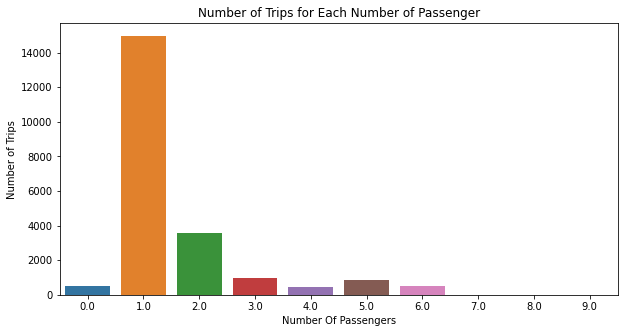

In [18]:
# Create a bar plot
plt.figure(figsize=(10, 5))
sns.barplot(data=df, x='passenger_count', y='count')
plt.xlabel('Number Of Passengers')
plt.ylabel('Number of Trips')
plt.title('Number of Trips for Each Number of Passenger')
plt.show()

Now, compute the following and make relevant plots:
1. Break down the trip distance distribution for each day of week

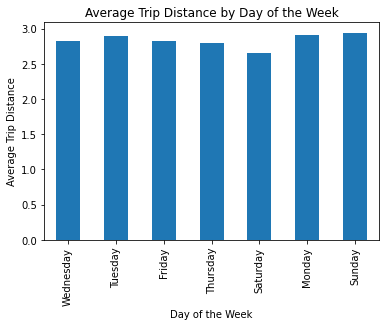

In [19]:
# Convert "tpep_pickup_datetime" column to datetime format
dfJaune12019 = dfJaune12019.withColumn('tpep_pickup_datetime', dfJaune12019['tpep_pickup_datetime'].cast('timestamp'))

# Extract the day of the week and create a new column
dfJaune12019 = dfJaune12019.withColumn('day_of_week', fn.date_format('tpep_pickup_datetime', 'EEEE'))

# Group the data by day of the week and compute trip distance statistics
trip_distance_stats = dfJaune12019.groupBy('day_of_week').agg({'trip_distance': 'mean'})

# Convert the Spark DataFrame to Pandas DataFrame for plotting
trip_distance_stats_pandas = trip_distance_stats.toPandas()

# Plot the trip distance distribution for each day of the week
trip_distance_stats_pandas.plot.bar(x='day_of_week', y='avg(trip_distance)', legend=False)
plt.xlabel('Day of the Week')
plt.ylabel('Average Trip Distance')
plt.title('Average Trip Distance by Day of the Week')
plt.show()

2. Count the number of distinct pickup location

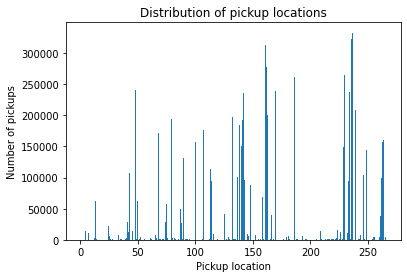

In [20]:
distinct_pickup_locations = dfJaune12019.groupBy('PULocationID').agg(fn.count('*').alias('num_pickups'))
df_pd = distinct_pickup_locations.toPandas()

# create bar chart
fig, ax = plt.subplots()
ax.bar(df_pd['PULocationID'], df_pd['num_pickups'])

# set axis labels and title
ax.set_xlabel('Pickup location')
ax.set_ylabel('Number of pickups')
ax.set_title('Distribution of pickup locations')

# show the plot
plt.show()

3. Compute and display tips and profits as a function of the pickup location

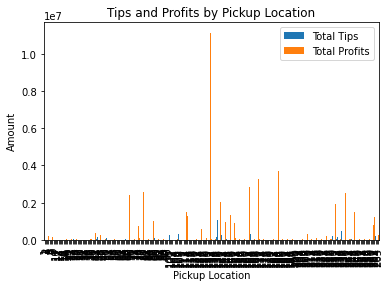

In [21]:
# Group the data by pickup location and compute aggregate statistics
pickup_location_stats = dfJaune12019.groupBy('PULocationID').agg(fn.sum('tip_amount').alias('Total Tips'), fn.sum('total_amount').alias('Total Profits'))

# Convert Spark DataFrame to Pandas DataFrame
pickup_location_stats_pd = pickup_location_stats.toPandas()

# Rename the columns for clarity
pickup_location_stats_pd = pickup_location_stats_pd.rename(columns={'Total Tips': 'Total Tips', 'Total Profits': 'Total Profits'})

# Sort the results by total profits in descending order
pickup_location_stats_pd = pickup_location_stats_pd.sort_values('Total Profits', ascending=False)

# Plot the results
pickup_location_stats_pd.plot(kind='bar', x='PULocationID', y=['Total Tips', 'Total Profits'])
plt.xlabel('Pickup Location')
plt.ylabel('Amount')
plt.title('Tips and Profits by Pickup Location')
plt.legend(['Total Tips', 'Total Profits'])
plt.show()

# 2 analyze the job

In [22]:
filtered_df_jaune12019.explain(extended =True)

== Parsed Logical Plan ==
'Filter ('PULocationID IN (1,132,163) AND 'DOLocationID IN (1,132,163))
+- Relation[VendorID#0L,tpep_pickup_datetime#1,tpep_dropoff_datetime#2,passenger_count#3,trip_distance#4,RatecodeID#5,store_and_fwd_flag#6,PULocationID#7L,DOLocationID#8L,payment_type#9L,fare_amount#10,extra#11,mta_tax#12,tip_amount#13,tolls_amount#14,improvement_surcharge#15,total_amount#16,congestion_surcharge#17,airport_fee#18] parquet

== Analyzed Logical Plan ==
VendorID: bigint, tpep_pickup_datetime: timestamp, tpep_dropoff_datetime: timestamp, passenger_count: double, trip_distance: double, RatecodeID: double, store_and_fwd_flag: string, PULocationID: bigint, DOLocationID: bigint, payment_type: bigint, fare_amount: double, extra: double, mta_tax: double, tip_amount: double, tolls_amount: double, improvement_surcharge: double, total_amount: double, congestion_surcharge: double, airport_fee: int
Filter (cast(PULocationID#7L as bigint) IN (cast(1 as bigint),cast(132 as bigint),cast(163

In [25]:
trip_distance_stats.explain(extended =True)

== Parsed Logical Plan ==
'Aggregate ['day_of_week], [unresolvedalias('day_of_week, None), 'avg(trip_distance#4) AS avg(trip_distance)#487]
+- Project [VendorID#0L, tpep_pickup_datetime#426, tpep_dropoff_datetime#2, passenger_count#3, trip_distance#4, RatecodeID#5, store_and_fwd_flag#6, PULocationID#7L, DOLocationID#8L, payment_type#9L, fare_amount#10, extra#11, mta_tax#12, tip_amount#13, tolls_amount#14, improvement_surcharge#15, total_amount#16, congestion_surcharge#17, airport_fee#18, date_format(tpep_pickup_datetime#426, EEEE, Some(Europe/Paris)) AS day_of_week#446]
   +- Project [VendorID#0L, cast(tpep_pickup_datetime#1 as timestamp) AS tpep_pickup_datetime#426, tpep_dropoff_datetime#2, passenger_count#3, trip_distance#4, RatecodeID#5, store_and_fwd_flag#6, PULocationID#7L, DOLocationID#8L, payment_type#9L, fare_amount#10, extra#11, mta_tax#12, tip_amount#13, tolls_amount#14, improvement_surcharge#15, total_amount#16, congestion_surcharge#17, airport_fee#18]
      +- Relation[Vend

In [26]:
distinct_pickup_locations.explain(extended =True)

== Parsed Logical Plan ==
'Aggregate ['PULocationID], [unresolvedalias('PULocationID, None), count(1) AS num_pickups#516L]
+- Project [VendorID#0L, tpep_pickup_datetime#426, tpep_dropoff_datetime#2, passenger_count#3, trip_distance#4, RatecodeID#5, store_and_fwd_flag#6, PULocationID#7L, DOLocationID#8L, payment_type#9L, fare_amount#10, extra#11, mta_tax#12, tip_amount#13, tolls_amount#14, improvement_surcharge#15, total_amount#16, congestion_surcharge#17, airport_fee#18, date_format(tpep_pickup_datetime#426, EEEE, Some(Europe/Paris)) AS day_of_week#446]
   +- Project [VendorID#0L, cast(tpep_pickup_datetime#1 as timestamp) AS tpep_pickup_datetime#426, tpep_dropoff_datetime#2, passenger_count#3, trip_distance#4, RatecodeID#5, store_and_fwd_flag#6, PULocationID#7L, DOLocationID#8L, payment_type#9L, fare_amount#10, extra#11, mta_tax#12, tip_amount#13, tolls_amount#14, improvement_surcharge#15, total_amount#16, congestion_surcharge#17, airport_fee#18]
      +- Relation[VendorID#0L,tpep_pick

# Investigate one month of trips data in 2019, 2020, 2021, 2022

## Filter and cache/persist the result

### les taxis jaunes:

1. le mois avril 2019

In [27]:
#Filter and cache the DataFrame based on a condition
dfJaune42019 = dfJaune42019.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

2.le mois janvier 2020

In [28]:
#Filter and cache the DataFrame based on a condition
dfJaune12020 = dfJaune12020.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

3.le mois janvier 2021

In [29]:
#Filter and cache the DataFrame based on a condition
dfJaune12021 = dfJaune12021.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

4.le mois janvier 2022

In [30]:
#Filter and cache the DataFrame based on a condition
dfJaune12022 = dfJaune12022.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

### Les taxis fhv:

1.le mois avril 2019

In [31]:
#Filter and cache the DataFrame based on a condition
dffhv42019 = dffhv42019.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

2.le mois janvier 2020

In [32]:
#Filter and cache the DataFrame based on a condition
dffhv12020 = dffhv12020.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

3.le mois janvier 2021

In [33]:
#Filter and cache the DataFrame based on a condition
dffhv12021 = dffhv12021.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

4.le mois janvier 2022

In [34]:
#Filter and cache the DataFrame based on a condition
dffhv12022 = dffhv12022.filter((fn.col("PULocationID").isin(zone_ID)) &
                                    (fn.col("DOLocationID").isin(zone_ID))).cache()

## Assessing seasonalities and looking at time series

### Les taxis Jaunes:

#### Le mois Janvier 2019:

1. The number of pickups:

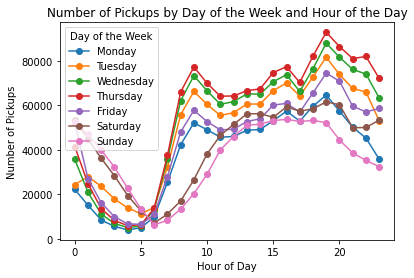

In [35]:
# Extract the day of the week and hour of the day
dfJaune12019 = dfJaune12019.withColumn('day_of_week', fn.date_format('tpep_pickup_datetime', 'EEEE'))
dfJaune12019 = dfJaune12019.withColumn('hour_of_day', fn.hour('tpep_pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dfJaune12019.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

2. The average fare by hour

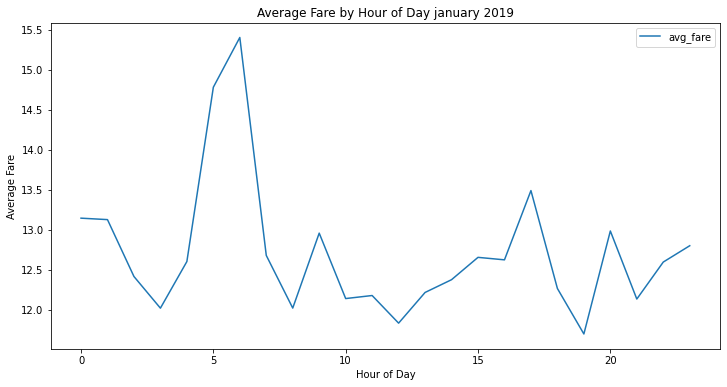

In [36]:
dfJaune12019 = dfJaune12019.withColumn("pickup_hour", fn.hour("tpep_pickup_datetime"))

fare_time_series = dfJaune12019.groupBy("pickup_hour").agg(fn.avg("fare_amount").alias("avg_fare"))

# Pivot the table to have hours as rows
fare_time_series_pd = fare_time_series.toPandas().set_index("pickup_hour")

# Plot time series
plt.figure(figsize=(12,6))
sns.lineplot(data=fare_time_series_pd, palette="tab10")
plt.title("Average Fare by Hour of Day january 2019")
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare")
plt.show()


The average fare by day of week:

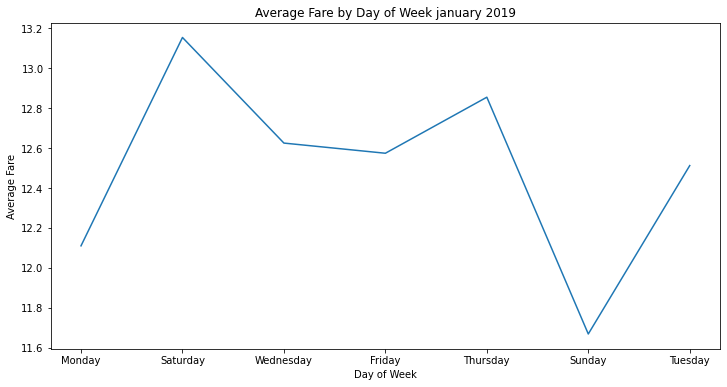

In [37]:
# Compute average fare by day of week
fare_day_of_week = dfJaune12019.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week")) \
                         .agg(fn.avg("fare_amount").alias("avg_fare"))

# Convert day of week to string representation
fare_day_of_week = fare_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Convert the data to a Pandas dataframe for plotting
fare_day_of_week_pd = fare_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(12, 6))
sns.lineplot(data=fare_day_of_week_pd, x="day_of_week", y="avg_fare", palette="tab10")
plt.title("Average Fare by Day of Week january 2019")
plt.xlabel("Day of Week")
plt.ylabel("Average Fare")
plt.show()

3. The average trip duration

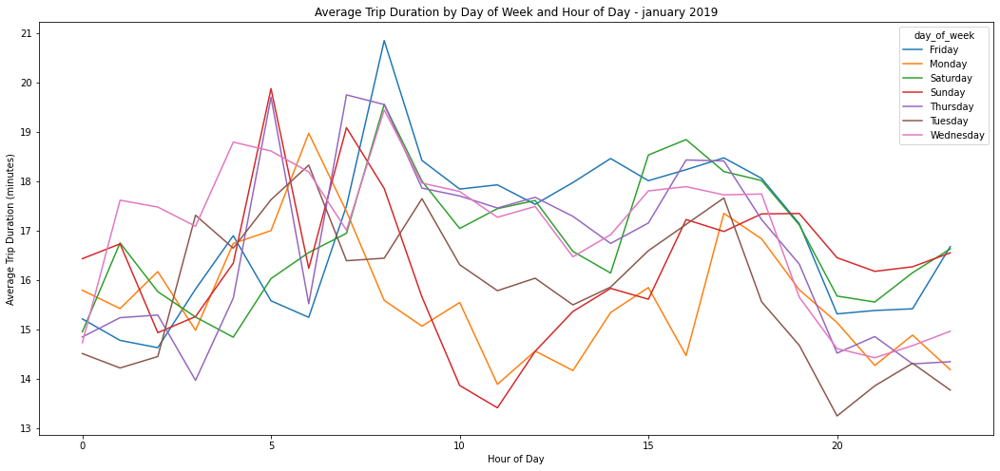

In [38]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dfJaune12019 = dfJaune12019.withColumn("pickup_time", fn.unix_timestamp("tpep_pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("tpep_dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dfJaune12019.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week"), 
                                           fn.hour("tpep_pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - january 2019")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

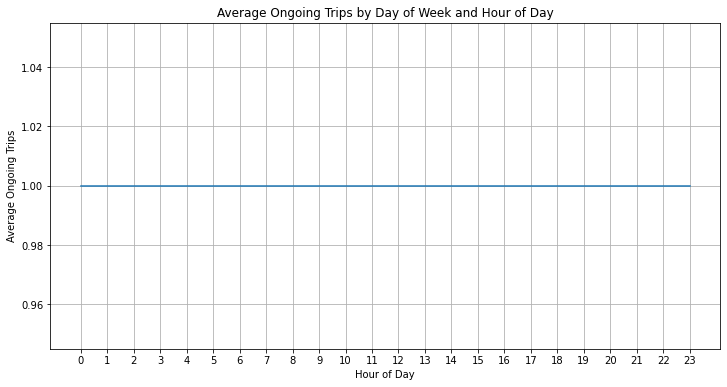

In [39]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dfJaune12019.filter(dfJaune12019['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2020:

1. The number of pickups

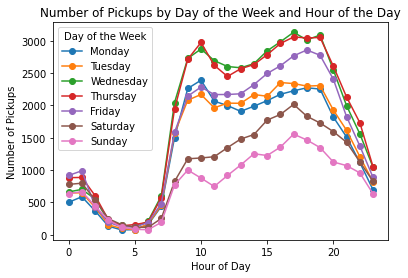

In [40]:
# Extract the day of the week and hour of the day
dfJaune42020 = dfJaune42020.withColumn('day_of_week', fn.date_format('tpep_pickup_datetime', 'EEEE'))
dfJaune42020 = dfJaune42020.withColumn('hour_of_day', fn.hour('tpep_pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dfJaune42020.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

2. The average fare by hour

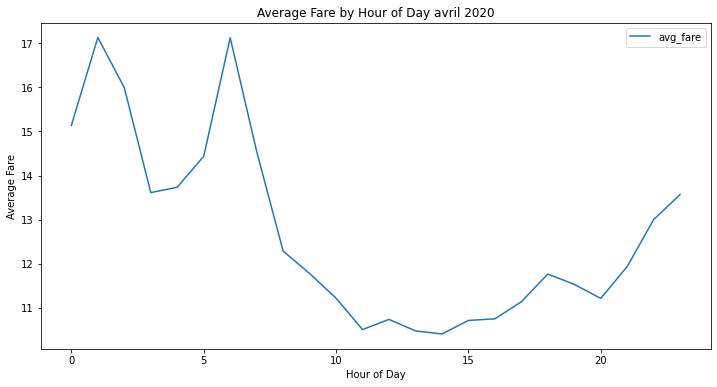

In [41]:
dfJaune42020 = dfJaune42020.withColumn("pickup_hour", fn.hour("tpep_pickup_datetime"))

fare_time_series = dfJaune42020.groupBy("pickup_hour").agg(fn.avg("fare_amount").alias("avg_fare"))

# Pivot the table to have hours as rows
fare_time_series_pd = fare_time_series.toPandas().set_index("pickup_hour")

# Plot time series
plt.figure(figsize=(12,6))
sns.lineplot(data=fare_time_series_pd, palette="tab10")
plt.title("Average Fare by Hour of Day avril 2020")
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare")
plt.show()

The average fare by day of week

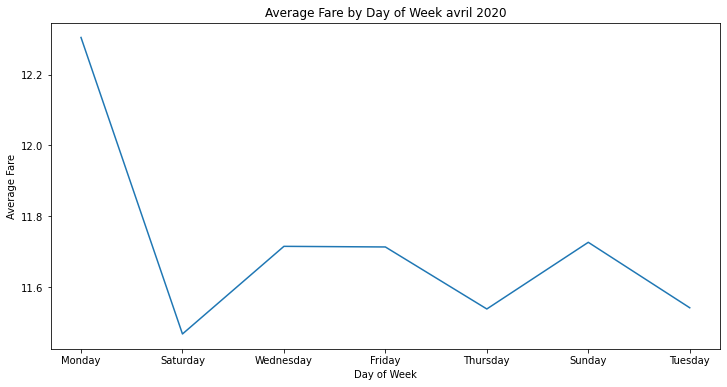

In [42]:
# Compute average fare by day of week
fare_day_of_week = dfJaune42020.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week")) \
                         .agg(fn.avg("fare_amount").alias("avg_fare"))

# Convert day of week to string representation
fare_day_of_week = fare_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Convert the data to a Pandas dataframe for plotting
fare_day_of_week_pd = fare_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(12, 6))
sns.lineplot(data=fare_day_of_week_pd, x="day_of_week", y="avg_fare", palette="tab10")
plt.title("Average Fare by Day of Week avril 2020")
plt.xlabel("Day of Week")
plt.ylabel("Average Fare")
plt.show()

3. The average trip duration

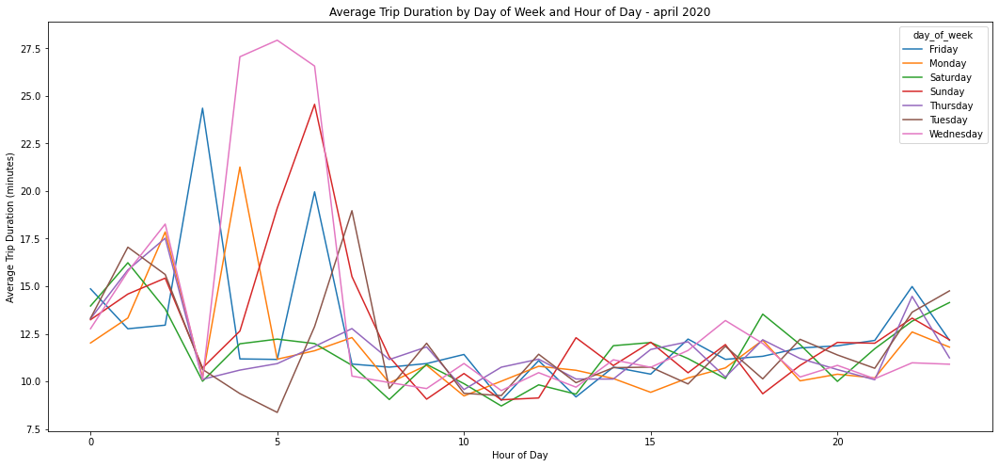

In [43]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dfJaune42020 = dfJaune42020.withColumn("pickup_time", fn.unix_timestamp("tpep_pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("tpep_dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dfJaune42020.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week"), 
                                           fn.hour("tpep_pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - april 2020")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

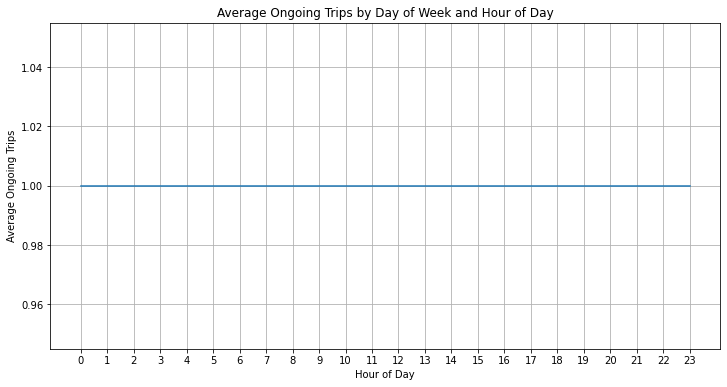

In [44]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dfJaune42020.filter(dfJaune42020['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2021:

1. The number of pickups

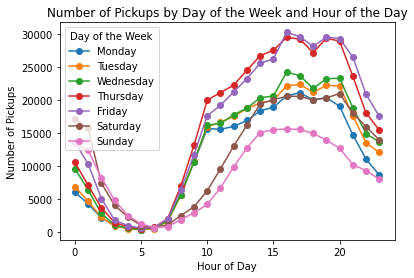

In [45]:
# Extract the day of the week and hour of the day
dfJaune42021 = dfJaune42021.withColumn('day_of_week', fn.date_format('tpep_pickup_datetime', 'EEEE'))
dfJaune42021 = dfJaune42021.withColumn('hour_of_day', fn.hour('tpep_pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dfJaune42021.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

2. The average fare by hour

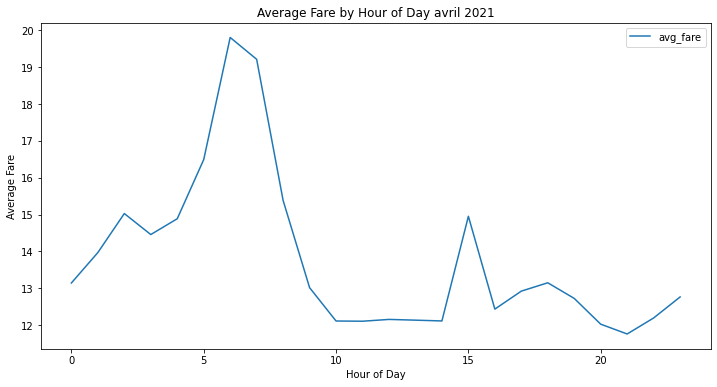

In [46]:
dfJaune42021 = dfJaune42021.withColumn("pickup_hour", fn.hour("tpep_pickup_datetime"))

fare_time_series = dfJaune42021.groupBy("pickup_hour").agg(fn.avg("fare_amount").alias("avg_fare"))

# Pivot the table to have hours as rows
fare_time_series_pd = fare_time_series.toPandas().set_index("pickup_hour")

# Plot time series
plt.figure(figsize=(12,6))
sns.lineplot(data=fare_time_series_pd, palette="tab10")
plt.title("Average Fare by Hour of Day avril 2021")
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare")
plt.show()

 The average fare by day of the week

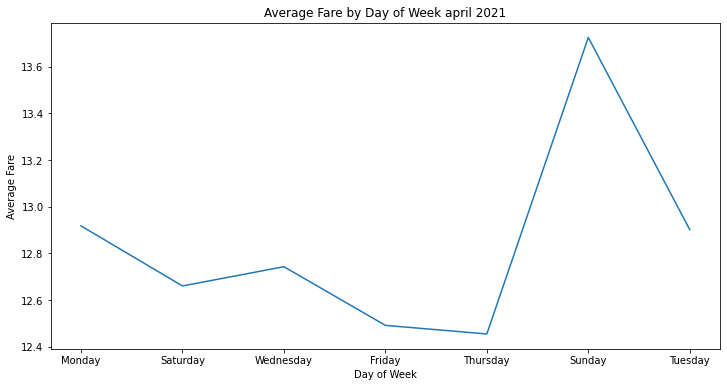

In [47]:
# Compute average fare by day of week
fare_day_of_week = dfJaune42021.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week")) \
                         .agg(fn.avg("fare_amount").alias("avg_fare"))

# Convert day of week to string representation
fare_day_of_week = fare_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Convert the data to a Pandas dataframe for plotting
fare_day_of_week_pd = fare_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(12, 6))
sns.lineplot(data=fare_day_of_week_pd, x="day_of_week", y="avg_fare", palette="tab10")
plt.title("Average Fare by Day of Week april 2021")
plt.xlabel("Day of Week")
plt.ylabel("Average Fare")
plt.show()

3. The average trip duration

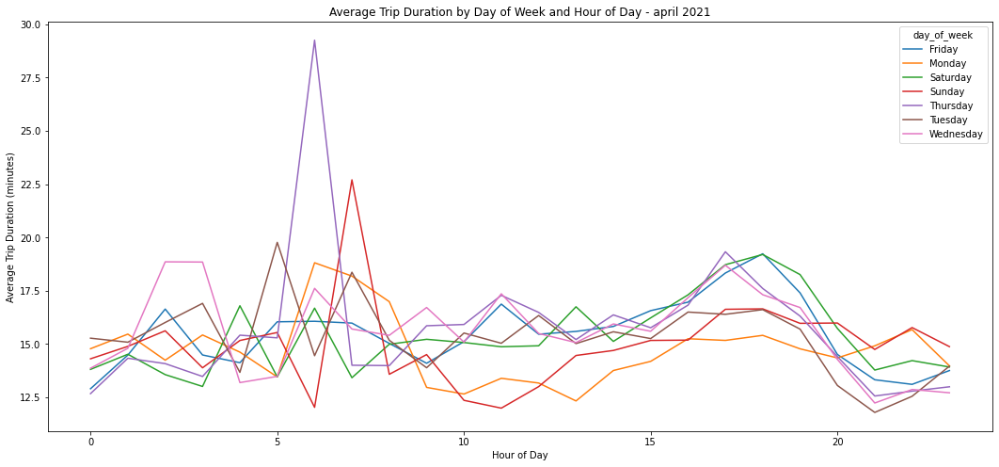

In [48]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dfJaune42021 = dfJaune42021.withColumn("pickup_time", fn.unix_timestamp("tpep_pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("tpep_dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dfJaune42021.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week"), 
                                           fn.hour("tpep_pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - april 2021")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

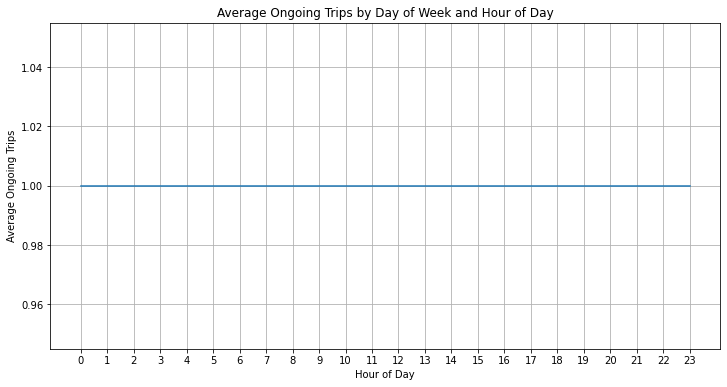

In [49]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dfJaune42021.filter(dfJaune42021['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2022

1. The number of pickups

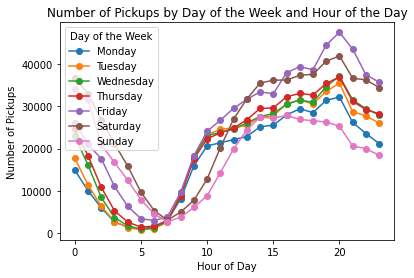

In [50]:
# Extract the day of the week and hour of the day
dfJaune42022 = dfJaune42022.withColumn('day_of_week', fn.date_format('tpep_pickup_datetime', 'EEEE'))
dfJaune42022 = dfJaune42022.withColumn('hour_of_day', fn.hour('tpep_pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dfJaune42022.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

2. The average fare by hour

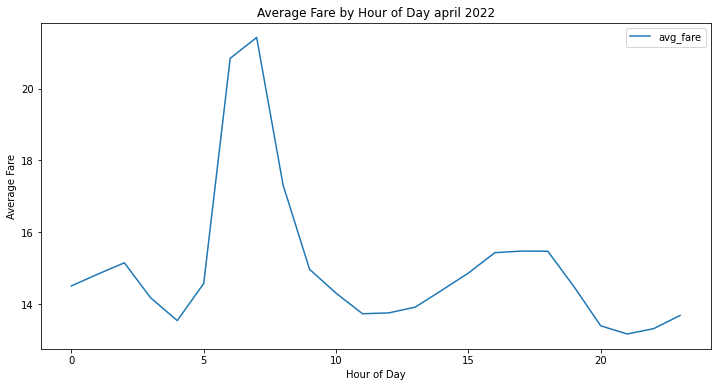

In [51]:
dfJaune42022 = dfJaune42022.withColumn("pickup_hour", fn.hour("tpep_pickup_datetime"))

fare_time_series = dfJaune42022.groupBy("pickup_hour").agg(fn.avg("fare_amount").alias("avg_fare"))

# Pivot the table to have hours as rows
fare_time_series_pd = fare_time_series.toPandas().set_index("pickup_hour")

# Plot time series
plt.figure(figsize=(12,6))
sns.lineplot(data=fare_time_series_pd, palette="tab10")
plt.title("Average Fare by Hour of Day april 2022")
plt.xlabel("Hour of Day")
plt.ylabel("Average Fare")
plt.show()

The average fare by day of the week

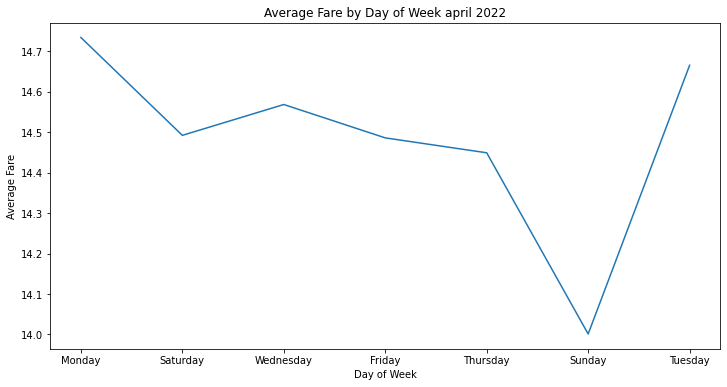

In [52]:
# Compute average fare by day of week
fare_day_of_week = dfJaune42022.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week")) \
                         .agg(fn.avg("fare_amount").alias("avg_fare"))

# Convert day of week to string representation
fare_day_of_week = fare_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Convert the data to a Pandas dataframe for plotting
fare_day_of_week_pd = fare_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(12, 6))
sns.lineplot(data=fare_day_of_week_pd, x="day_of_week", y="avg_fare", palette="tab10")
plt.title("Average Fare by Day of Week april 2022")
plt.xlabel("Day of Week")
plt.ylabel("Average Fare")
plt.show()

3. The average trip duration

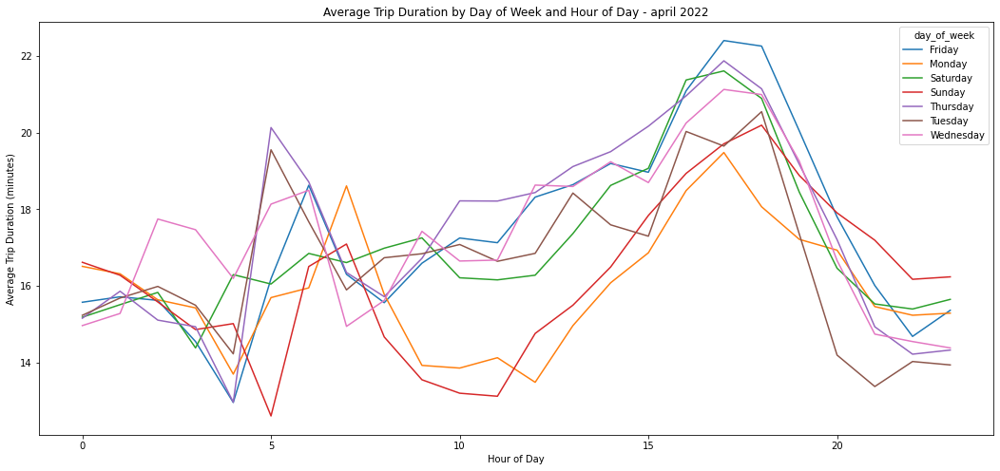

In [53]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dfJaune42022 = dfJaune42022.withColumn("pickup_time", fn.unix_timestamp("tpep_pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("tpep_dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dfJaune42022.groupBy(fn.dayofweek("tpep_pickup_datetime").alias("day_of_week"), 
                                           fn.hour("tpep_pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - april 2022")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

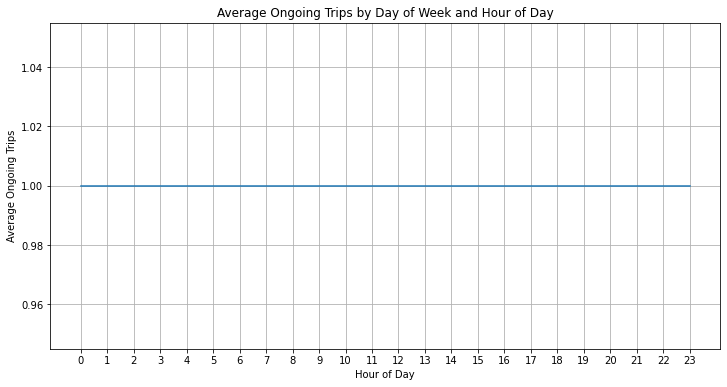

In [54]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dfJaune42022.filter(dfJaune42022['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

### Les taxis fhv

#### Le mois janvier 2019:

1. The number of pickups:

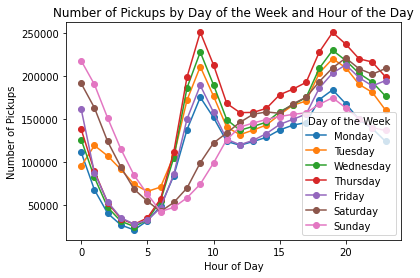

In [55]:
# Extract the day of the week and hour of the day
dffhv12019 = dffhv12019.withColumn('day_of_week', fn.date_format('pickup_datetime', 'EEEE'))
dffhv12019 = dffhv12019.withColumn('hour_of_day', fn.hour('pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dffhv12019.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

3. The average trip duration

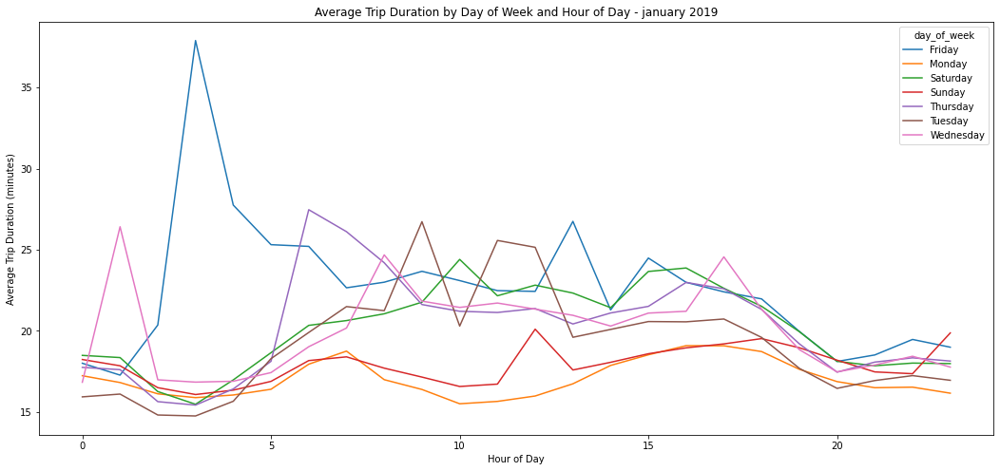

In [56]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dffhv12019 = dffhv12019.withColumn("pickup_time", fn.unix_timestamp("pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dffhv12019.groupBy(fn.dayofweek("pickup_datetime").alias("day_of_week"), 
                                           fn.hour("pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - january 2019")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

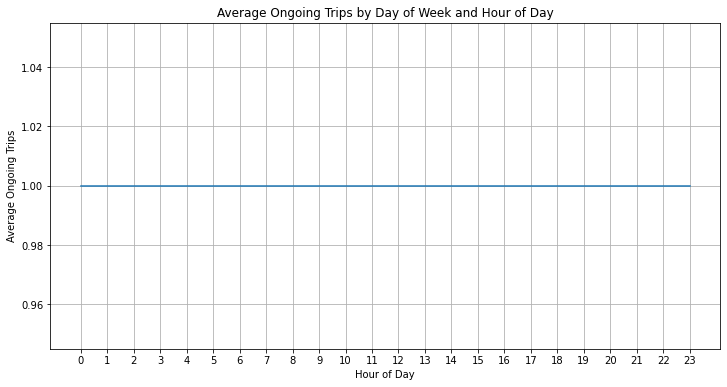

In [57]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dffhv12019.filter(dffhv12019['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2020: 

1. The number of pickups:

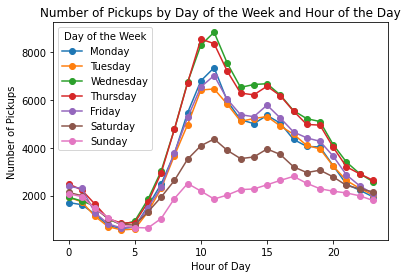

In [58]:
# Extract the day of the week and hour of the day
dffhv42020 = dffhv42020.withColumn('day_of_week', fn.date_format('pickup_datetime', 'EEEE'))
dffhv42020 = dffhv42020.withColumn('hour_of_day', fn.hour('pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dffhv42020.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

3. The average trip duration

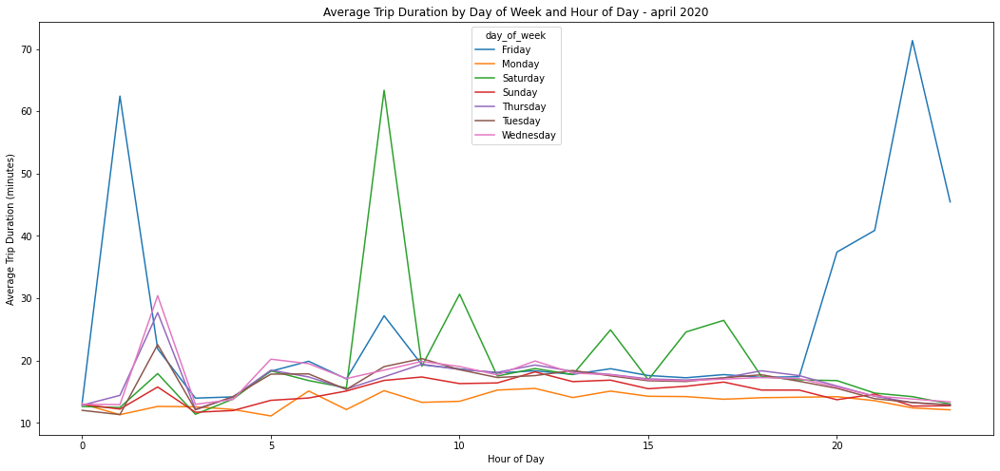

In [59]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dffhv42020 = dffhv42020.withColumn("pickup_time", fn.unix_timestamp("pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dffhv42020.groupBy(fn.dayofweek("pickup_datetime").alias("day_of_week"), 
                                           fn.hour("pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - april 2020")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

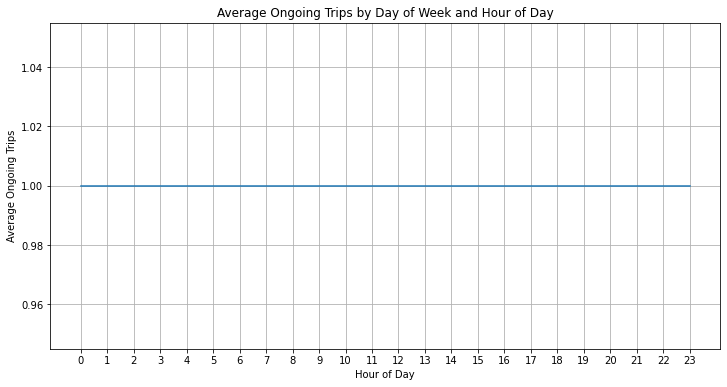

In [60]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dffhv42020.filter(dffhv42020['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2021: 

1. The number of pickups:

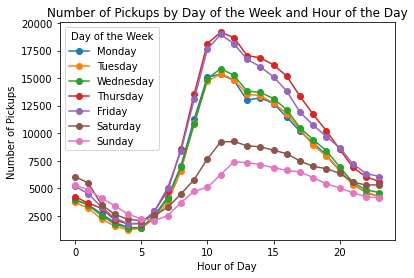

In [61]:
# Extract the day of the week and hour of the day
dffhv42021 = dffhv42021.withColumn('day_of_week', fn.date_format('pickup_datetime', 'EEEE'))
dffhv42021 = dffhv42021.withColumn('hour_of_day', fn.hour('pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dffhv42021.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

3. The average trip duration

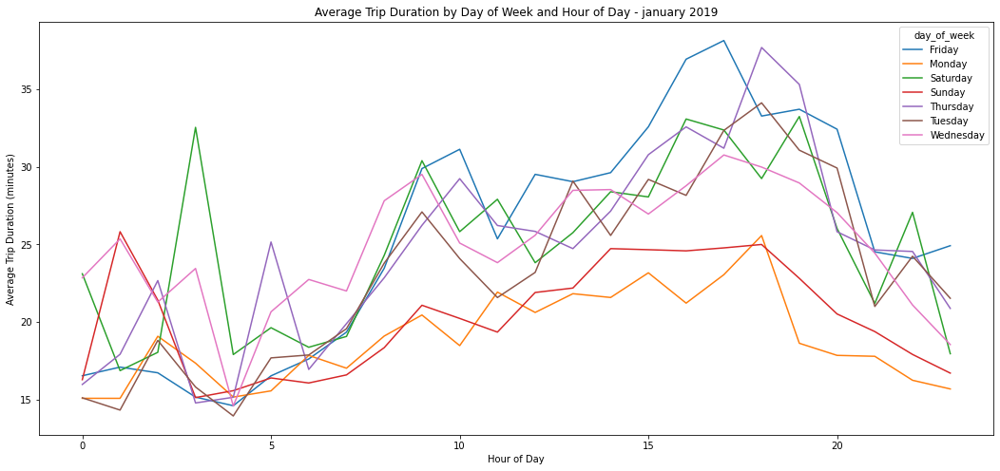

In [62]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dffhv42021 = dffhv42021.withColumn("pickup_time", fn.unix_timestamp("pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dffhv42021.groupBy(fn.dayofweek("pickup_datetime").alias("day_of_week"), 
                                           fn.hour("pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - january 2019")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

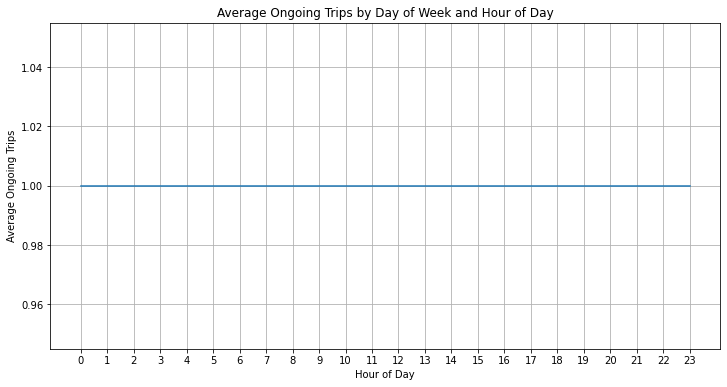

In [63]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dffhv42021.filter(dffhv42021['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

#### Le mois avril 2022: 

1. The number of pickups:

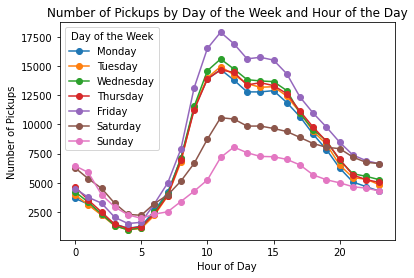

In [64]:
# Extract the day of the week and hour of the day
dffhv42022 = dffhv42022.withColumn('day_of_week', fn.date_format('pickup_datetime', 'EEEE'))
dffhv42022 = dffhv42022.withColumn('hour_of_day', fn.hour('pickup_datetime'))

# Group the data by day of the week and hour of the day and compute the count of pickups
pickup_time_series = dffhv42022.groupby('day_of_week', 'hour_of_day').count().orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
pickup_time_series_pd = pickup_time_series.toPandas()

# Pivot the DataFrame for plotting
pickup_time_series_pivot = pickup_time_series_pd.pivot('hour_of_day', 'day_of_week', 'count')

# Reorder the columns for proper sorting in the plot
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
pickup_time_series_pivot = pickup_time_series_pivot[days_of_week]

# Plot the time series
pickup_time_series_pivot.plot(kind='line', marker='o')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.title('Number of Pickups by Day of the Week and Hour of the Day')
plt.legend(title='Day of the Week')
plt.show()

3. The average trip duration

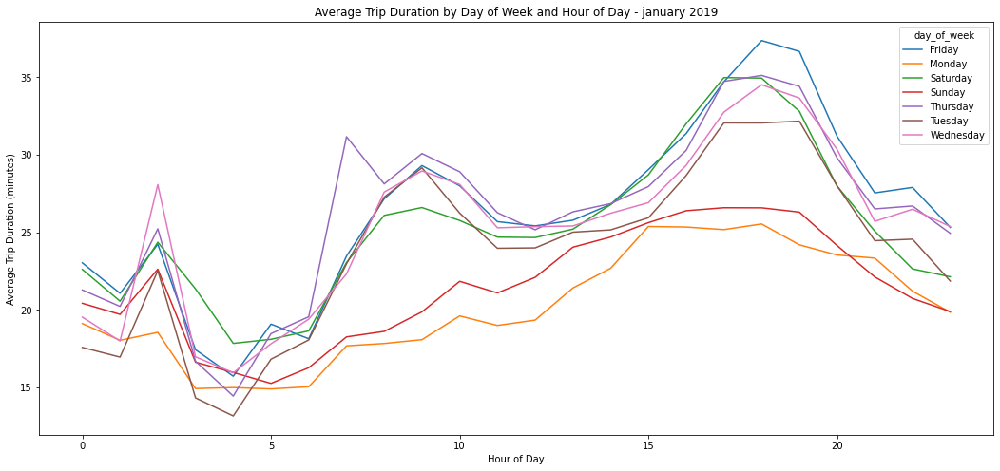

In [65]:
# Convert pickup and dropoff timestamps to Unix time and calculate trip duration
dffhv42022 = dffhv42022.withColumn("pickup_time", fn.unix_timestamp("pickup_datetime")) \
               .withColumn("dropoff_time", fn.unix_timestamp("dropoff_datetime")) \
               .withColumn("trip_duration", (fn.col("dropoff_time") - fn.col("pickup_time")) / 60)

# Compute average trip duration by day of week and hour of day
trip_duration_day_of_week = dffhv42022.groupBy(fn.dayofweek("pickup_datetime").alias("day_of_week"), 
                                           fn.hour("pickup_datetime").alias("hour_of_day")) \
                                   .agg(fn.avg("trip_duration").alias("avg_duration"))

# Convert day of week to string representation
trip_duration_day_of_week = trip_duration_day_of_week.withColumn("day_of_week", 
                                               when(fn.col("day_of_week") == 1, "Monday") \
                                               .when(fn.col("day_of_week") == 2, "Tuesday") \
                                               .when(fn.col("day_of_week") == 3, "Wednesday") \
                                               .when(fn.col("day_of_week") == 4, "Thursday") \
                                               .when(fn.col("day_of_week") == 5, "Friday") \
                                               .when(fn.col("day_of_week") == 6, "Saturday") \
                                               .when(fn.col("day_of_week") == 7, "Sunday"))

# Sort the data by day of week and hour of day
trip_duration_day_of_week = trip_duration_day_of_week.orderBy("day_of_week", "hour_of_day")

# Convert the data to a Pandas dataframe for plotting
trip_duration_day_of_week_pd = trip_duration_day_of_week.toPandas()

# Plot the time series
plt.figure(figsize=(18, 8))
sns.lineplot(data=trip_duration_day_of_week_pd, x="hour_of_day", y="avg_duration", hue="day_of_week", palette="tab10")
plt.title("Average Trip Duration by Day of Week and Hour of Day - january 2019")
plt.xlabel("Hour of Day")
plt.ylabel("Average Trip Duration (minutes)")
plt.show()

4. Plot the average of ongoing trips

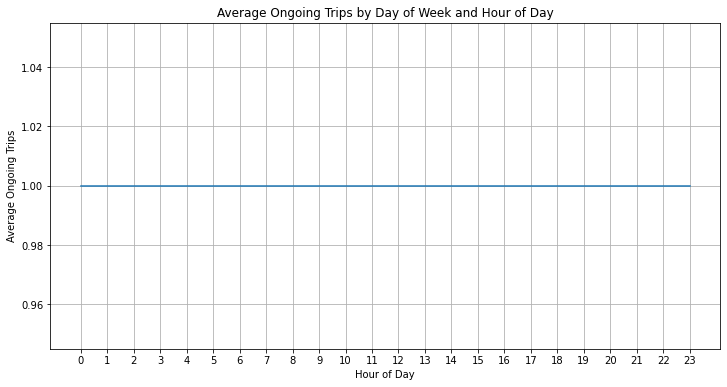

In [66]:
# Filter the DataFrame for ongoing trips (trip_duration > 0)
ongoing_trips = dffhv42022.filter(dffhv42022['trip_duration'] > 0)

# Group the data by day of the week and hour of the day and compute the average number of ongoing trips
ongoing_trips_time_series = ongoing_trips.groupby('day_of_week', 'hour_of_day').agg(fn.avg(fn.lit(1)).alias('Average Ongoing Trips')).orderBy('day_of_week', 'hour_of_day')

# Convert the DataFrame to Pandas for plotting
ongoing_trips_pd = ongoing_trips_time_series.toPandas()

# Plot the average number of ongoing trips
plt.figure(figsize=(12, 6))
plt.plot(ongoing_trips_pd['hour_of_day'], ongoing_trips_pd['Average Ongoing Trips'])
plt.xlabel('Hour of Day')
plt.ylabel('Average Ongoing Trips')
plt.title('Average Ongoing Trips by Day of Week and Hour of Day')
plt.xticks(range(24))
plt.grid(True)
plt.show()

## Rides to the airports

### Les taxis jaunes:

#### Le mois janvier 2019

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

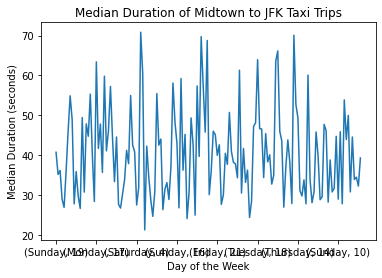

In [67]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune12019.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

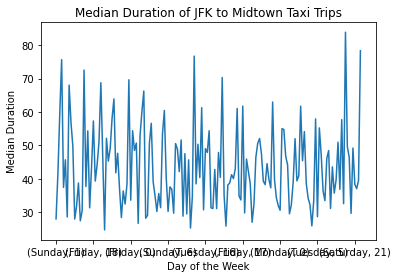

In [68]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune12019.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2020

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

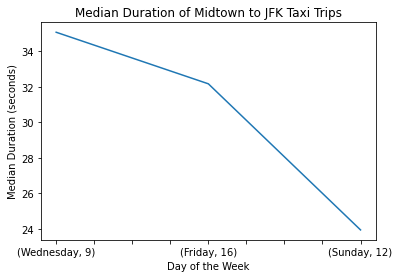

In [69]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42020.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

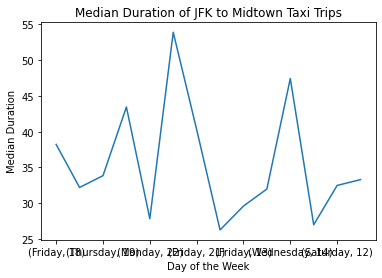

In [70]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42020.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2021

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

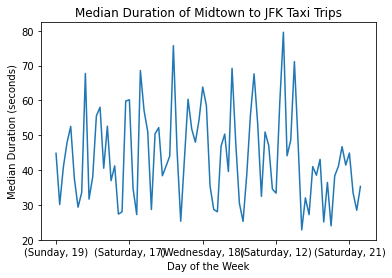

In [71]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42021.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

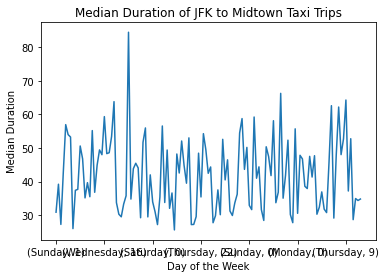

In [72]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42021.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2022

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

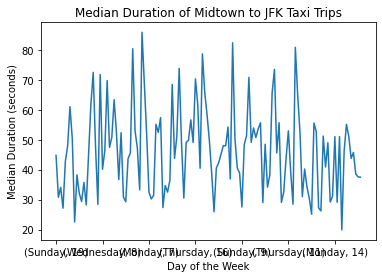

In [73]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42022.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

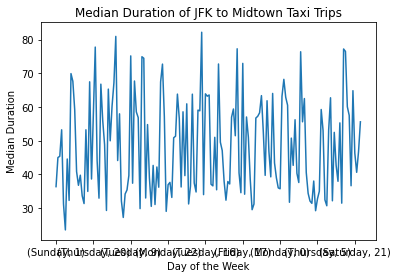

In [74]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dfJaune42022.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

### Les taxis fhv:

#### Le mois janvier 2019:

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

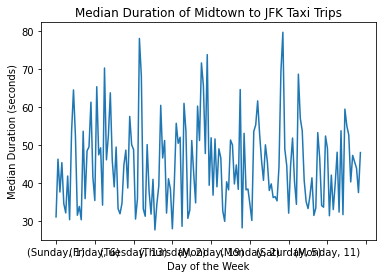

In [75]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv12019.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

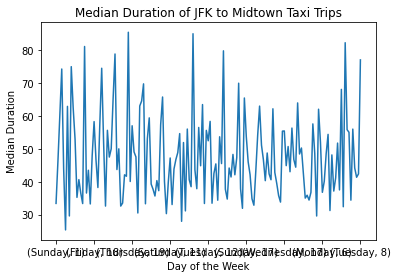

In [76]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv12019.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2020:

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

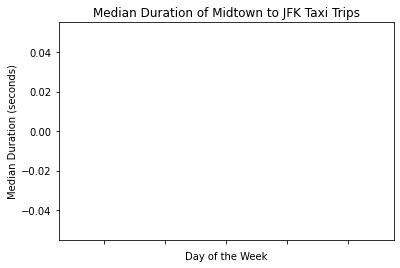

In [77]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42020.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

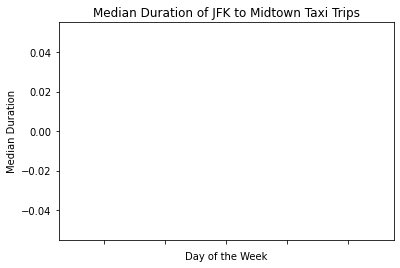

In [78]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42020.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2021:

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

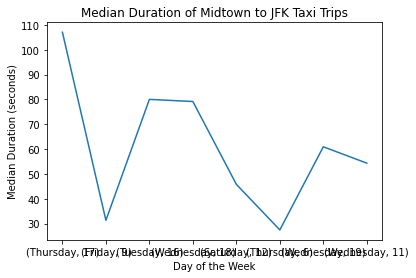

In [79]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42021.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

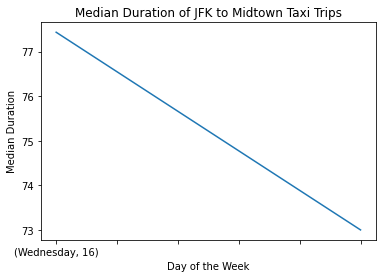

In [80]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42021.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

#### Le mois avril 2022:

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK
Airport

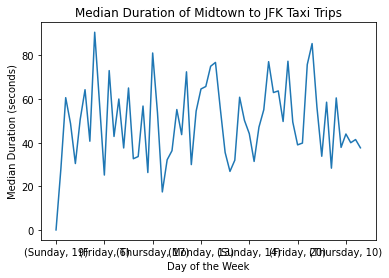

In [81]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42022.filter((fn.col("PULocationID") == 163) & (fn.col("DOLocationID") == 132))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration (seconds)")
plt.title("Median Duration of Midtown to JFK Taxi Trips")
plt.show()

2. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhat-
tan)

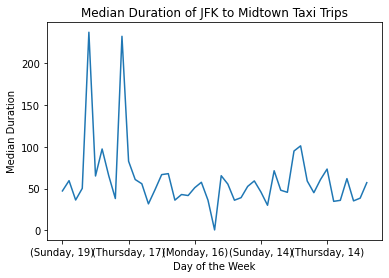

In [82]:
# Filter the dataframe for trips from Midtown to JFK
filtered_df = dffhv42022.filter((fn.col("PULocationID") == 132) & (fn.col("DOLocationID") == 163))

# Calculate the median duration of trips for each day of the week and hour of the day
median_duration_df = filtered_df.groupBy("day_of_week", "hour_of_day").agg(fn.expr("percentile_approx(trip_duration, 0.5)").alias("median_duration"))

# Plot the time series
pandas_df = median_duration_df.toPandas()
pandas_df.set_index(["day_of_week", "hour_of_day"], inplace=True)
pandas_df["median_duration"].plot()

# Display the plot
plt.xlabel("Day of the Week")
plt.ylabel("Median Duration")
plt.title("Median Duration of JFK to Midtown Taxi Trips")
plt.show()

## Geographic information

In [88]:
!pip install pyspark-dist-explore

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


### Les taxis jaunes:

#### Le mois janvier 2019:

1.1.Heatmap where color is a function of number of pickups:

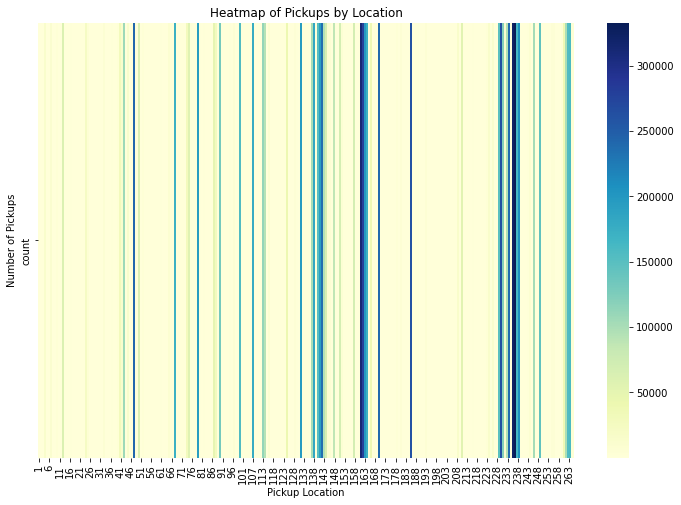

In [83]:
pickup_counts = dfJaune12019.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

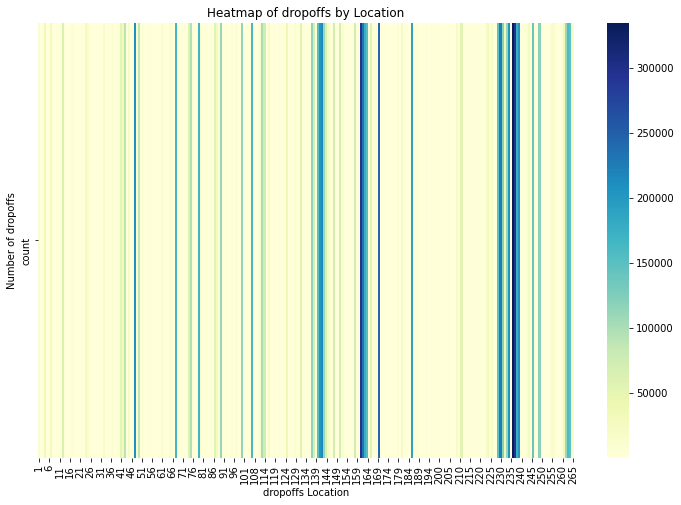

In [84]:
dropoffs_counts = dfJaune12019.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

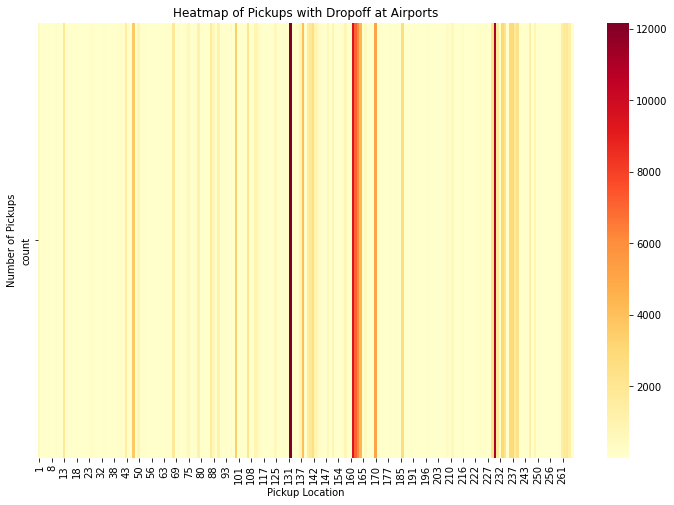

In [85]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dfJaune12019.filter(dfJaune12019.DOLocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()


2.1.A choropeth map where color is a function of number of pickups in the area:

In [86]:
!pip install geopandas matplotlib

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [89]:
import geopandas as gpd

In [87]:
path = Path('taxi_zones/taxi_zones.shp')
if not path.exists():
    url = "https://d37ci6vzurychx.cloudfront.net/misc/taxi_zones.zip"
    r = requests.get(url)
    z = zipfile.ZipFile(io.BytesIO(r.content))
    z.extractall(path='./taxi_zones')

In [90]:
# Load the geographic boundary data (shapefile)
boundary_data = gpd.read_file('./taxi_zones/taxi_zones.shp') 

In [91]:
boundary_data.columns

Index(['OBJECTID', 'Shape_Leng', 'Shape_Area', 'zone', 'LocationID', 'borough',
       'geometry'],
      dtype='object')

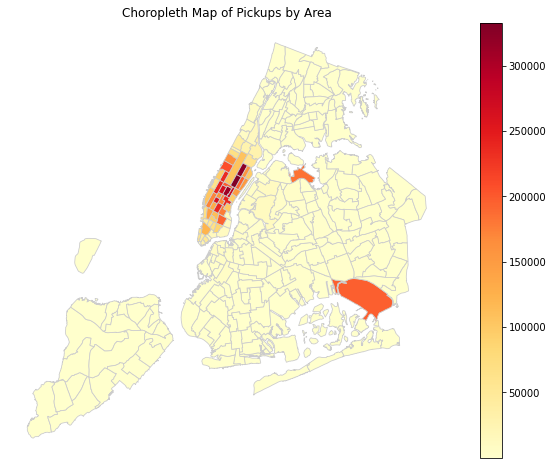

In [92]:
pickup_counts = dfJaune12019.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

2.2.A choropeth map where color is a function of ratio of number of payments by card/number of cash payments for pickups in the area:

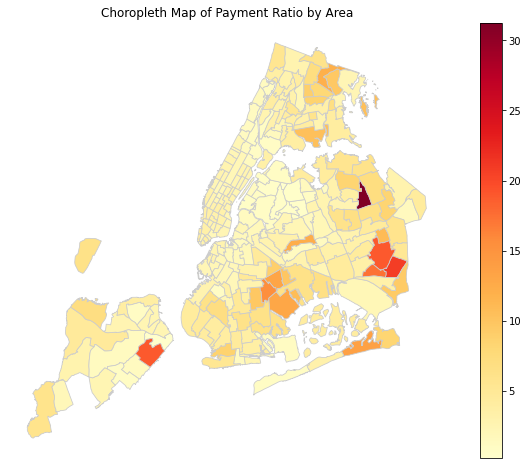

In [93]:
#Group the data by pickup location (PULocationID) and count the number of payments by card and cash for each location:
payment_counts = dfJaune12019.groupBy('PULocationID', 'payment_type').count()

#Pivot the payment counts to get the number of payments by card and cash for each pickup location
payment_pivot = payment_counts.groupBy('PULocationID').pivot('payment_type').sum('count')

#Calculate the ratio of the number of payments by card to the number of cash payments
payment_pivot = payment_pivot.withColumn('ratio', payment_pivot['1'] / payment_pivot['2'])

#Convert the PySpark DataFrame to a Pandas DataFrame
payment_pandas = payment_pivot.toPandas()

#Merge the payment data with the geographic boundary data based on the pickup location IDs
joined_data = boundary_data.merge(payment_pandas, left_on='LocationID', right_on='PULocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Payment Ratio by Area')
plt.show()


2.3.A choropeth map where color is a function of ratio of total fare/trip duration for dropoff in the area

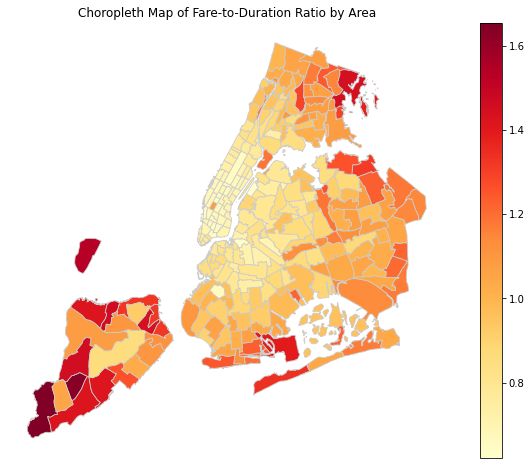

In [94]:
#Group the data by dropoff location (DOLocationID) and calculate the total fare and total trip duration for each location
dropoff_stats = dfJaune12019.groupBy('DOLocationID').agg(fn.sum('fare_amount').alias('Total Fare'), fn.sum('trip_duration').alias('Total Trip Duration'))

#Calculate the ratio of the total fare to the trip duration
dropoff_stats = dropoff_stats.withColumn('Ratio', dropoff_stats['Total Fare'] / dropoff_stats['Total Trip Duration'])

#Convert the PySpark DataFrame to a Pandas DataFrame
dropoff_pandas = dropoff_stats.toPandas()

#Merge the dropoff data with the geographic boundary data based on the dropoff location IDs
joined_data = boundary_data.merge(dropoff_pandas, left_on='LocationID', right_on='DOLocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='Ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Fare-to-Duration Ratio by Area')
plt.show()


3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [95]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dfJaune12019.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()


3.2.An interactive chorophet where the color is a function of average ratio of tip over total fare amount for pickups in the area at given hour of the day

#### Le mois avril 2020:

1.1.Heatmap where color is a function of number of pickups:

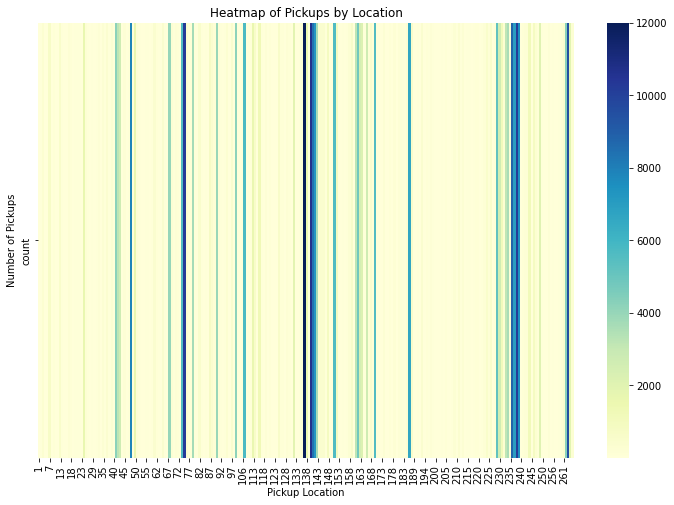

In [96]:
pickup_counts = dfJaune42020.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

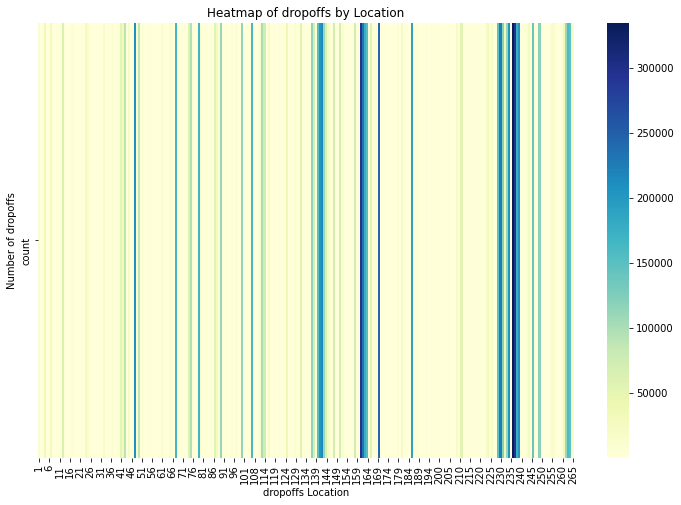

In [97]:
dropoffs_counts = dfJaune12019.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

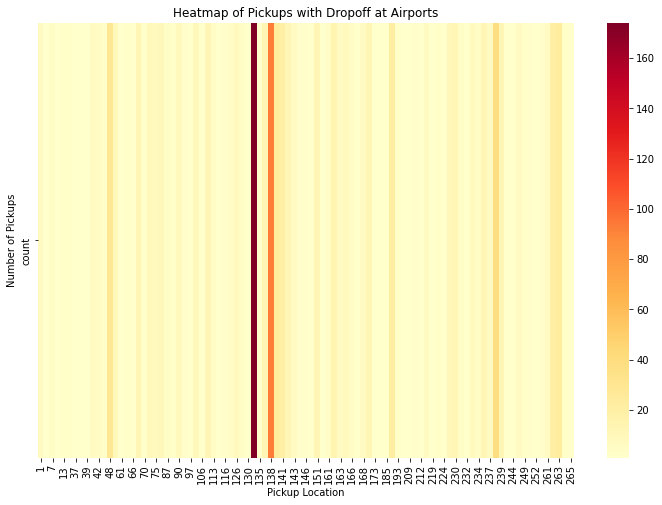

In [98]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dfJaune42020.filter(dfJaune42020.DOLocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

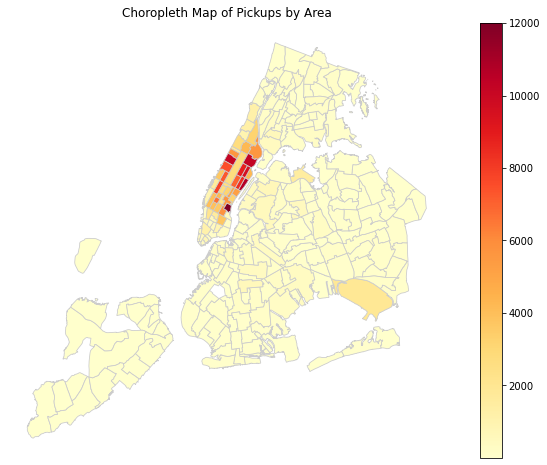

In [99]:
pickup_counts = dfJaune42020.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

2.2.A choropeth map where color is a function of ratio of number of payments by card/number of cash payments for pickups in the area:

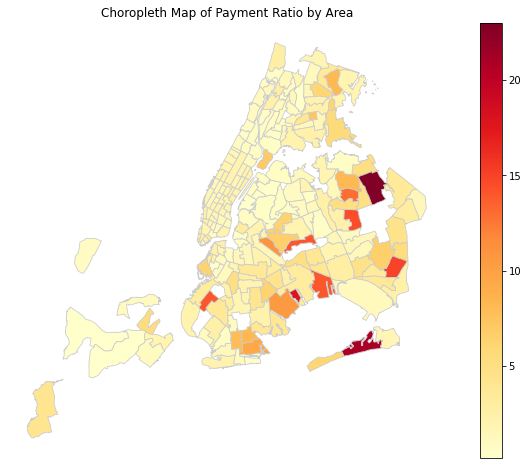

In [100]:
#Group the data by pickup location (PULocationID) and count the number of payments by card and cash for each location:
payment_counts = dfJaune42020.groupBy('PULocationID', 'payment_type').count()

#Pivot the payment counts to get the number of payments by card and cash for each pickup location
payment_pivot = payment_counts.groupBy('PULocationID').pivot('payment_type').sum('count')

#Calculate the ratio of the number of payments by card to the number of cash payments
payment_pivot = payment_pivot.withColumn('ratio', payment_pivot['1'] / payment_pivot['2'])

#Convert the PySpark DataFrame to a Pandas DataFrame
payment_pandas = payment_pivot.toPandas()

#Merge the payment data with the geographic boundary data based on the pickup location IDs
joined_data = boundary_data.merge(payment_pandas, left_on='LocationID', right_on='PULocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Payment Ratio by Area')
plt.show()


2.3.A choropeth map where color is a function of ratio of total fare/trip duration for dropoff in the area

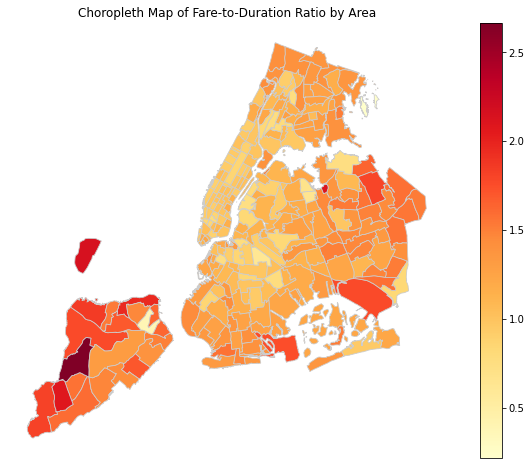

In [101]:
#Group the data by dropoff location (DOLocationID) and calculate the total fare and total trip duration for each location
dropoff_stats = dfJaune42020.groupBy('DOLocationID').agg(fn.sum('fare_amount').alias('Total Fare'), fn.sum('trip_duration').alias('Total Trip Duration'))

#Calculate the ratio of the total fare to the trip duration
dropoff_stats = dropoff_stats.withColumn('Ratio', dropoff_stats['Total Fare'] / dropoff_stats['Total Trip Duration'])

#Convert the PySpark DataFrame to a Pandas DataFrame
dropoff_pandas = dropoff_stats.toPandas()

#Merge the dropoff data with the geographic boundary data based on the dropoff location IDs
joined_data = boundary_data.merge(dropoff_pandas, left_on='LocationID', right_on='DOLocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='Ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Fare-to-Duration Ratio by Area')
plt.show()


3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [102]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dfJaune42020.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

3.2.An interactive chorophet where the color is a function of average ratio of tip over total fare amount for pickups in the area at given hour of the day

#### Le mois avril 2021: 

1.1.Heatmap where color is a function of number of pickups:

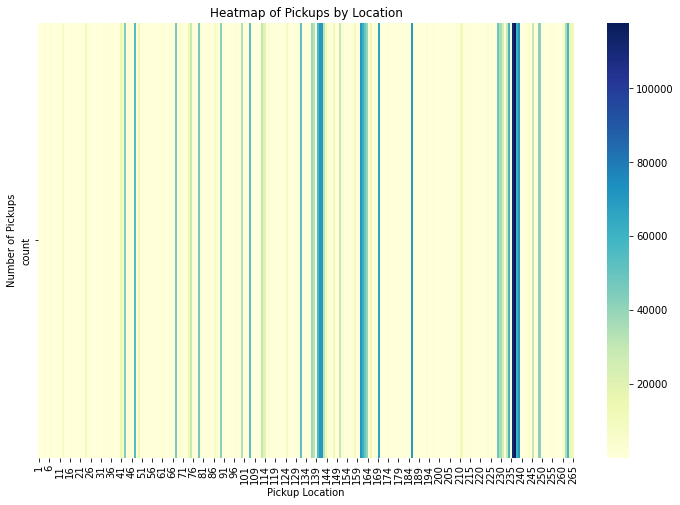

In [103]:
pickup_counts = dfJaune42021.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

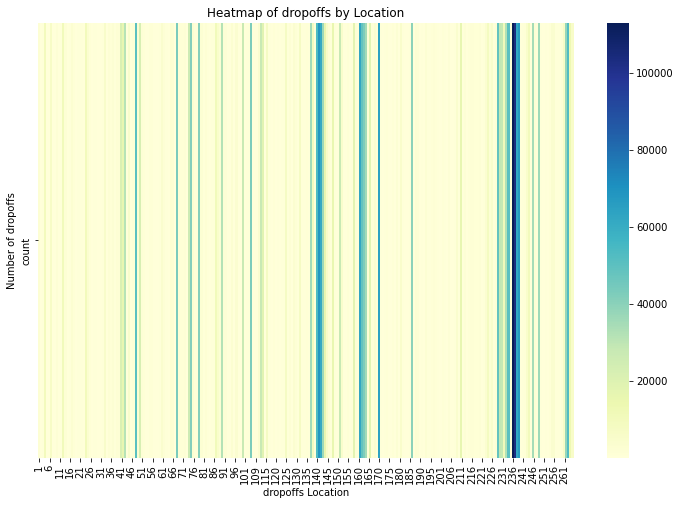

In [104]:
dropoffs_counts = dfJaune42021.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

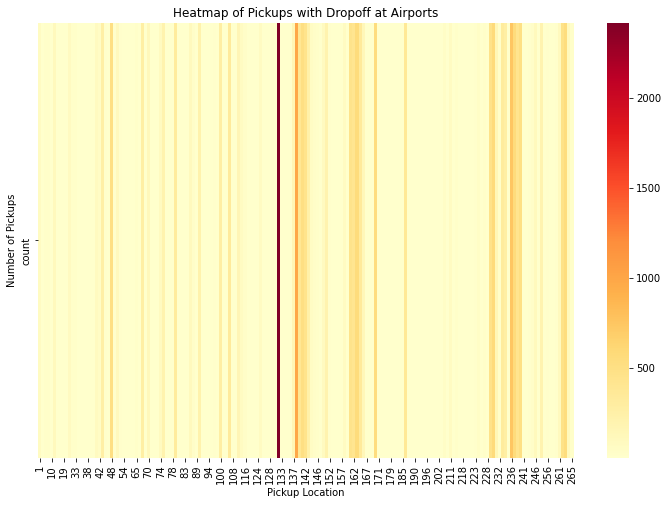

In [107]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dfJaune42021.filter(dfJaune42021.DOLocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

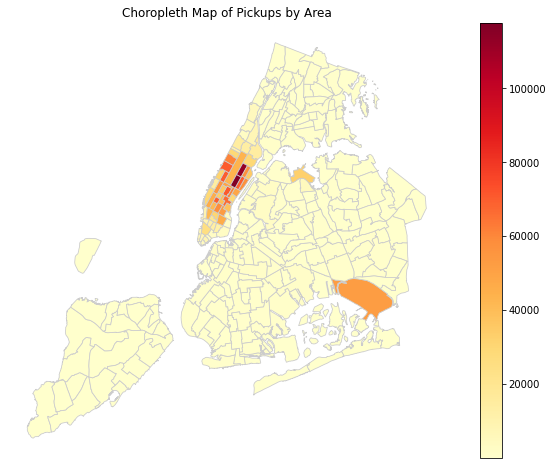

In [108]:
pickup_counts = dfJaune42021.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

2.2.A choropeth map where color is a function of ratio of number of payments by card/number of cash payments for pickups in the area:

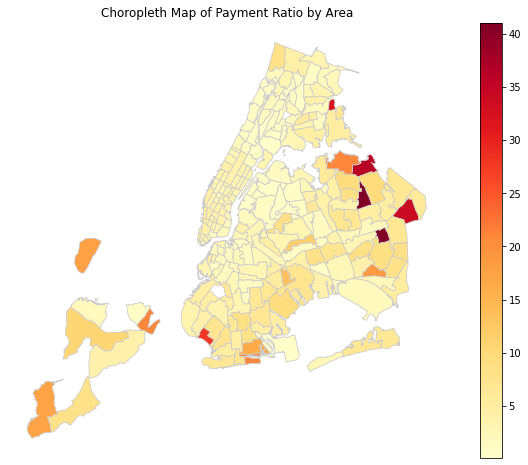

In [109]:
#Group the data by pickup location (PULocationID) and count the number of payments by card and cash for each location:
payment_counts = dfJaune42021.groupBy('PULocationID', 'payment_type').count()

#Pivot the payment counts to get the number of payments by card and cash for each pickup location
payment_pivot = payment_counts.groupBy('PULocationID').pivot('payment_type').sum('count')

#Calculate the ratio of the number of payments by card to the number of cash payments
payment_pivot = payment_pivot.withColumn('ratio', payment_pivot['1'] / payment_pivot['2'])

#Convert the PySpark DataFrame to a Pandas DataFrame
payment_pandas = payment_pivot.toPandas()

#Merge the payment data with the geographic boundary data based on the pickup location IDs
joined_data = boundary_data.merge(payment_pandas, left_on='LocationID', right_on='PULocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Payment Ratio by Area')
plt.show()

2.3.A choropeth map where color is a function of ratio of total fare/trip duration for dropoff in the area

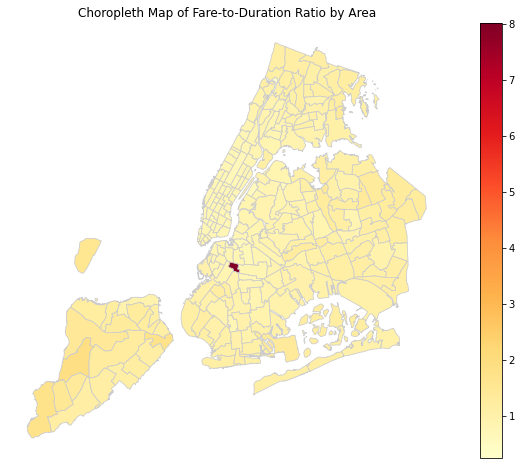

In [120]:
#Group the data by dropoff location (DOLocationID) and calculate the total fare and total trip duration for each location
dropoff_stats = dfJaune42021.groupBy('DOLocationID').agg(fn.sum('fare_amount').alias('Total Fare'), fn.sum('trip_duration').alias('Total Trip Duration'))

#Calculate the ratio of the total fare to the trip duration
dropoff_stats = dropoff_stats.withColumn('Ratio', dropoff_stats['Total Fare'] / dropoff_stats['Total Trip Duration'])

#Convert the PySpark DataFrame to a Pandas DataFrame
dropoff_pandas = dropoff_stats.toPandas()

#Merge the dropoff data with the geographic boundary data based on the dropoff location IDs
joined_data = boundary_data.merge(dropoff_pandas, left_on='LocationID', right_on='DOLocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='Ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Fare-to-Duration Ratio by Area')
plt.show()


3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [111]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dfJaune42021.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

3.2.An interactive chorophet where the color is a function of average ratio of tip over total fare amount for pickups in the area at given hour of the day

#### Le mois avril 2022:

1.1.Heatmap where color is a function of number of pickups:

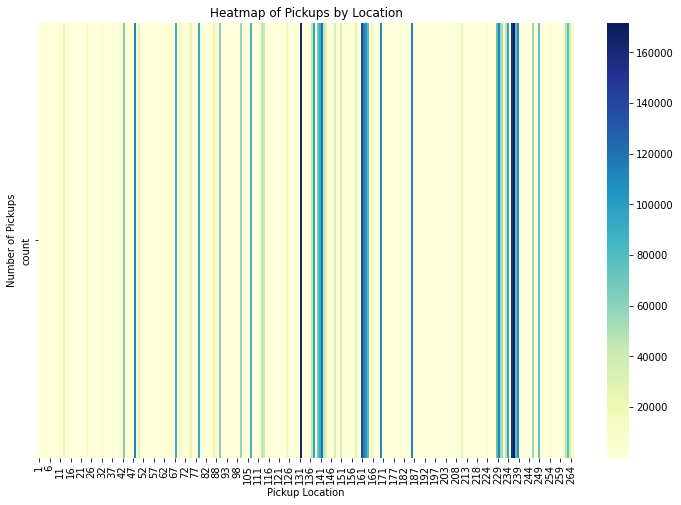

In [112]:
pickup_counts = dfJaune42022.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

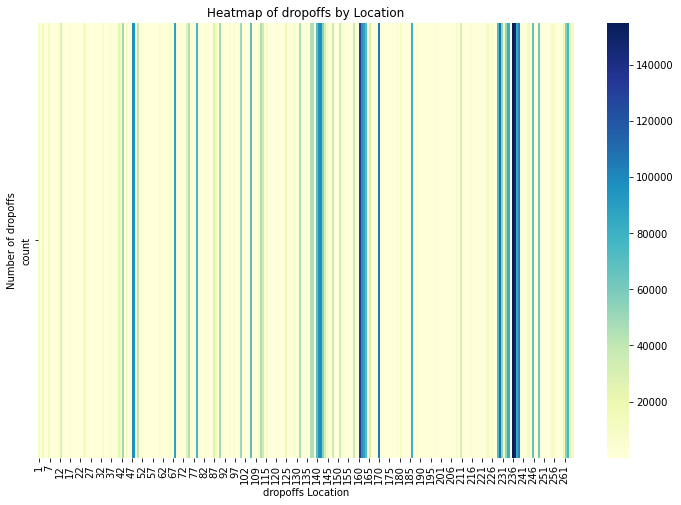

In [113]:
dropoffs_counts = dfJaune42022.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

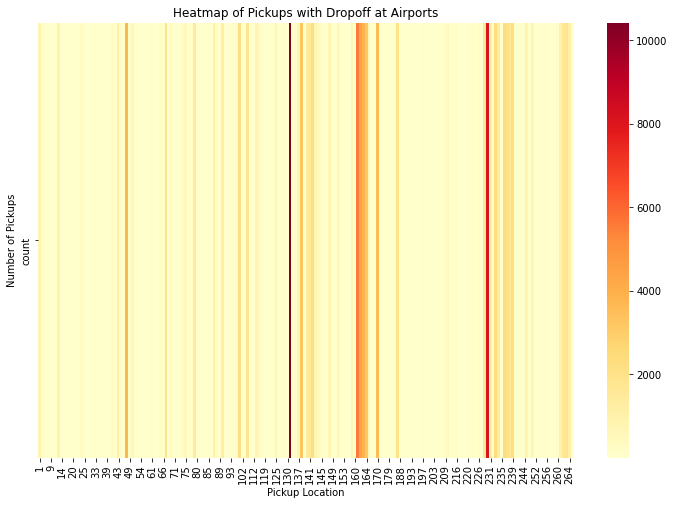

In [114]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dfJaune42022.filter(dfJaune42022.DOLocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()


2.1.A choropeth map where color is a function of number of pickups in the area:

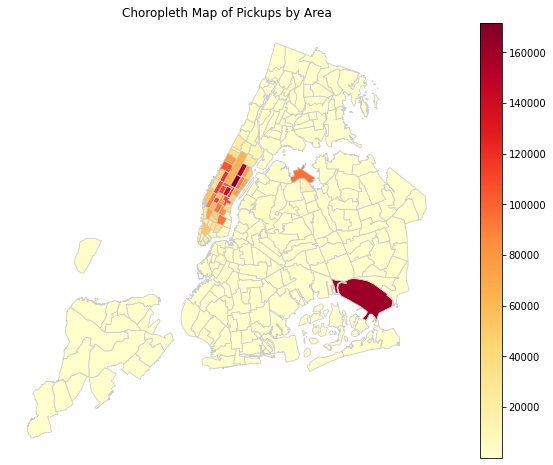

In [115]:
pickup_counts = dfJaune42022.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

2.2.A choropeth map where color is a function of ratio of number of payments by card/number of cash payments for pickups in the area:

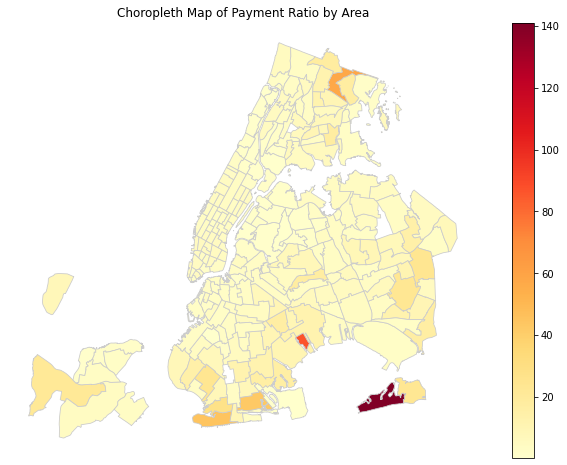

In [116]:
#Group the data by pickup location (PULocationID) and count the number of payments by card and cash for each location:
payment_counts = dfJaune42022.groupBy('PULocationID', 'payment_type').count()

#Pivot the payment counts to get the number of payments by card and cash for each pickup location
payment_pivot = payment_counts.groupBy('PULocationID').pivot('payment_type').sum('count')

#Calculate the ratio of the number of payments by card to the number of cash payments
payment_pivot = payment_pivot.withColumn('ratio', payment_pivot['1'] / payment_pivot['2'])

#Convert the PySpark DataFrame to a Pandas DataFrame
payment_pandas = payment_pivot.toPandas()

#Merge the payment data with the geographic boundary data based on the pickup location IDs
joined_data = boundary_data.merge(payment_pandas, left_on='LocationID', right_on='PULocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Payment Ratio by Area')
plt.show()

2.3.A choropeth map where color is a function of ratio of total fare/trip duration for dropoff in the area

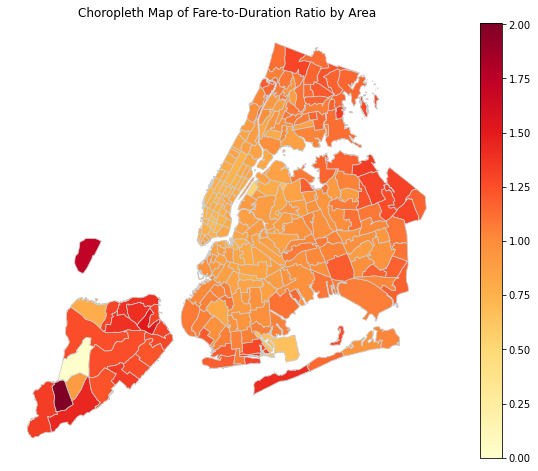

In [121]:
#Group the data by dropoff location (DOLocationID) and calculate the total fare and total trip duration for each location
dropoff_stats = dfJaune42022.groupBy('DOLocationID').agg(fn.sum('fare_amount').alias('Total Fare'), fn.sum('trip_duration').alias('Total Trip Duration'))

#Calculate the ratio of the total fare to the trip duration
dropoff_stats = dropoff_stats.withColumn('Ratio', dropoff_stats['Total Fare'] / dropoff_stats['Total Trip Duration'])

#Convert the PySpark DataFrame to a Pandas DataFrame
dropoff_pandas = dropoff_stats.toPandas()

#Merge the dropoff data with the geographic boundary data based on the dropoff location IDs
joined_data = boundary_data.merge(dropoff_pandas, left_on='LocationID', right_on='DOLocationID', how='left')

#Create the choropleth map using the merged data
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='Ratio', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Fare-to-Duration Ratio by Area')
plt.show()


3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [122]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dfJaune42022.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

### Les taxis fhv:

#### Le mois janvier 2019:

1.1.Heatmap where color is a function of number of pickups:

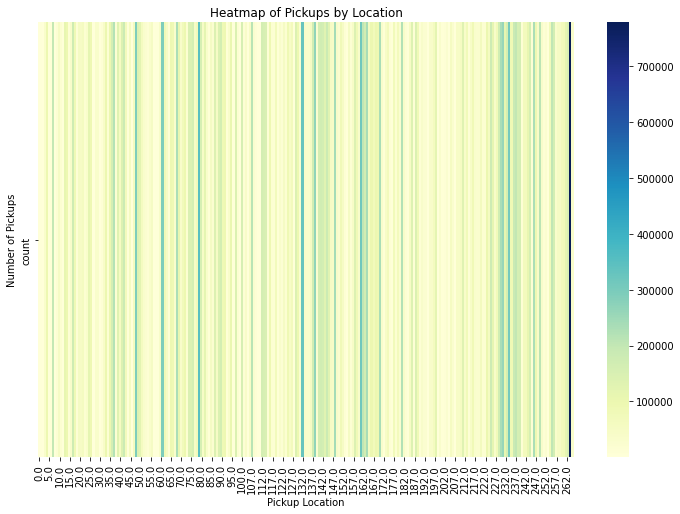

In [123]:
pickup_counts = dffhv12019.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

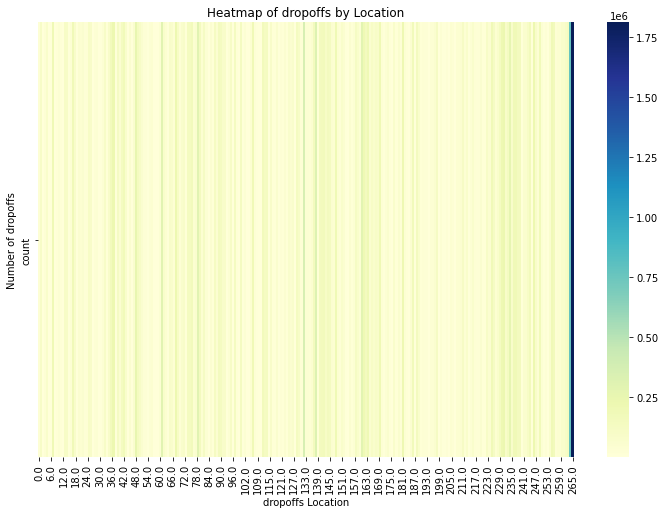

In [124]:
dropoffs_counts = dffhv12019.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

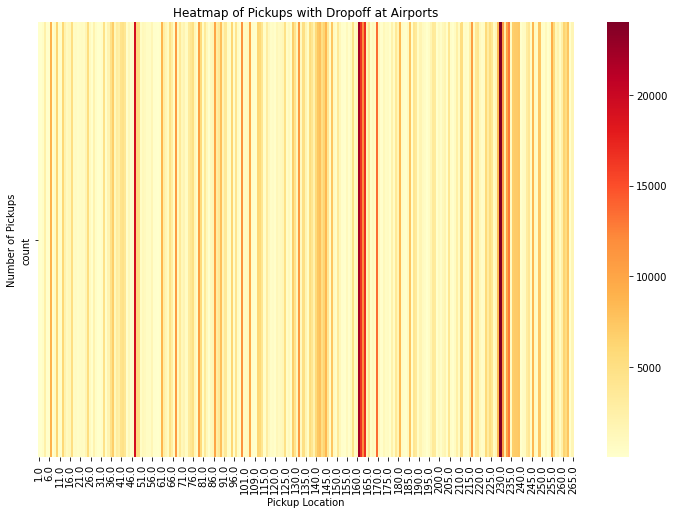

In [125]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dffhv12019.filter(dffhv12019.DOlocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

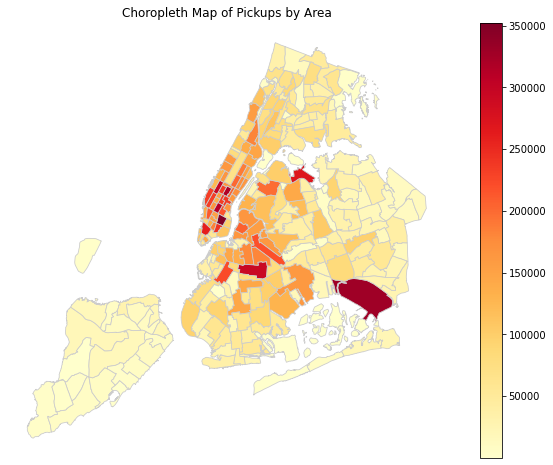

In [126]:
pickup_counts = dffhv12019.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

2.2.A choropeth map where color is a function of ratio of number of payments by card/number of cash payments for pickups in the area:

2.3.A choropeth map where color is a function of ratio of total fare/trip duration for dropoff in the area

3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [127]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dffhv12019.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

3.2.An interactive chorophet where the color is a function of average ratio of tip over total fare amount for pickups in the area at given hour of the day

#### Le mois avril 2020:

1.1.Heatmap where color is a function of number of pickups:

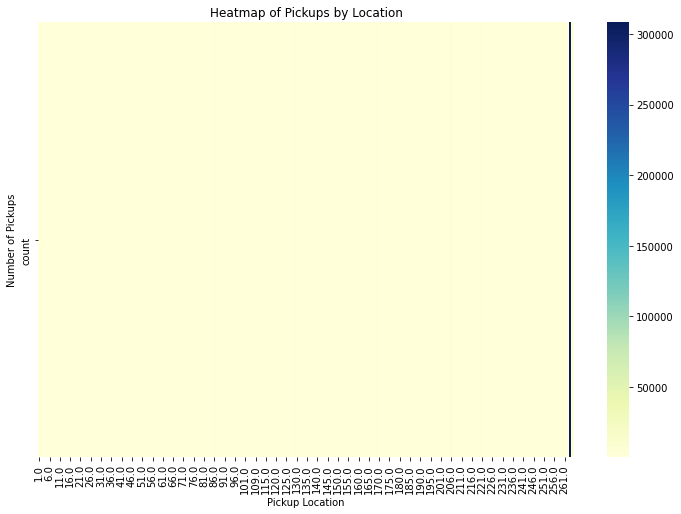

In [129]:
pickup_counts = dffhv42020.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

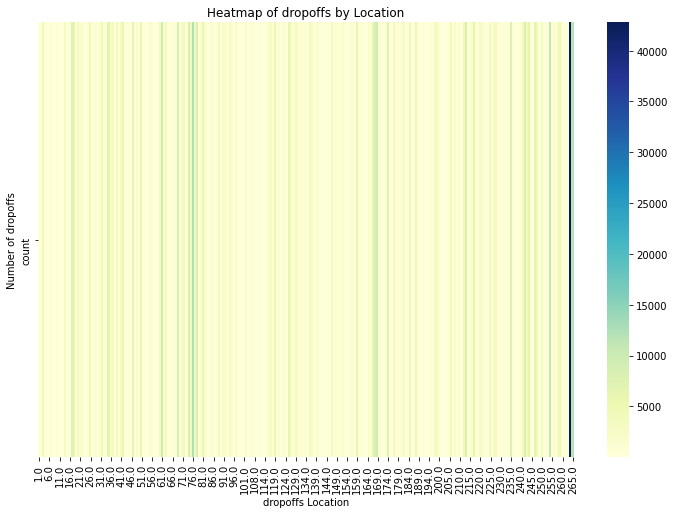

In [130]:
dropoffs_counts = dffhv42020.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

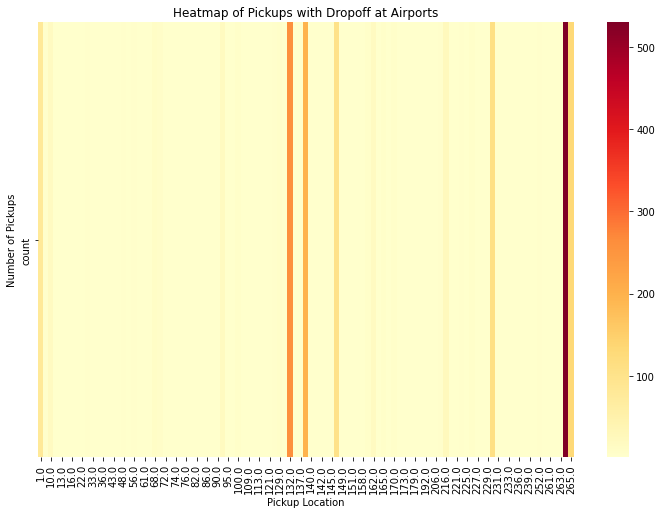

In [131]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dffhv42020.filter(dffhv42020.DOlocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

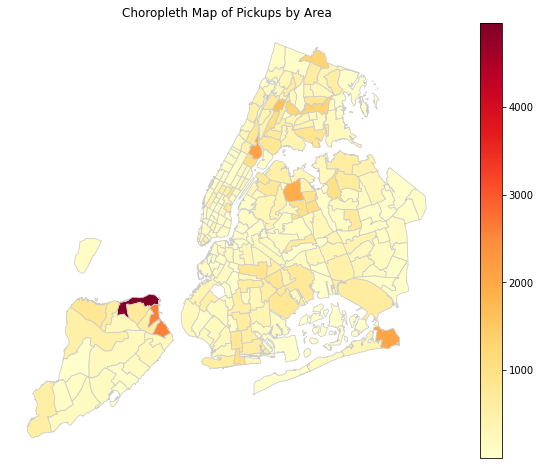

In [132]:
pickup_counts = dffhv42020.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [133]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dffhv42020.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

#### Le mois avril 2021:

1.1.Heatmap where color is a function of number of pickups:

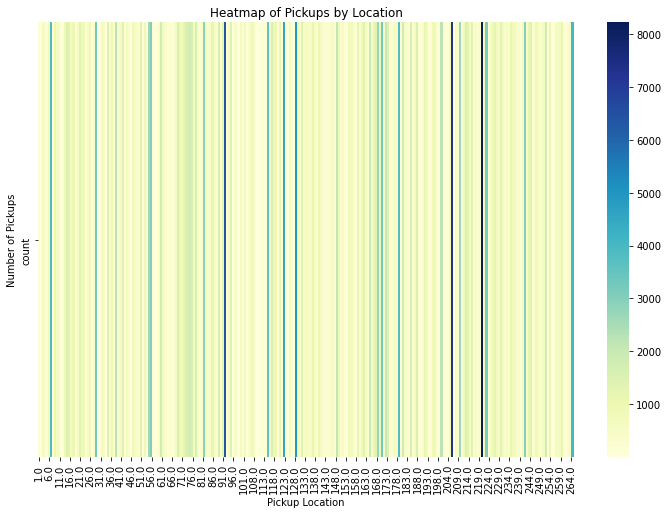

In [134]:
pickup_counts = dffhv42021.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

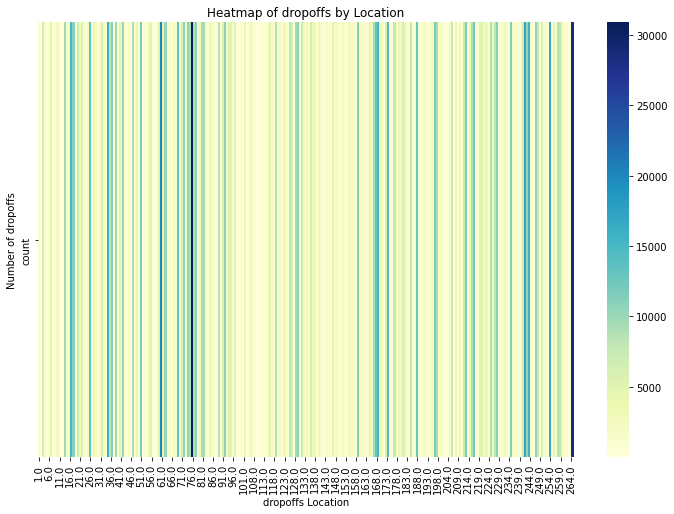

In [135]:
dropoffs_counts = dffhv42021.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

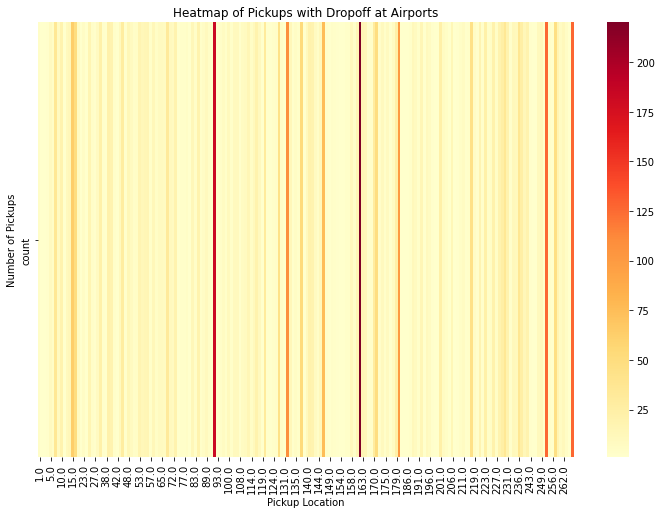

In [136]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dffhv42021.filter(dffhv42021.DOlocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

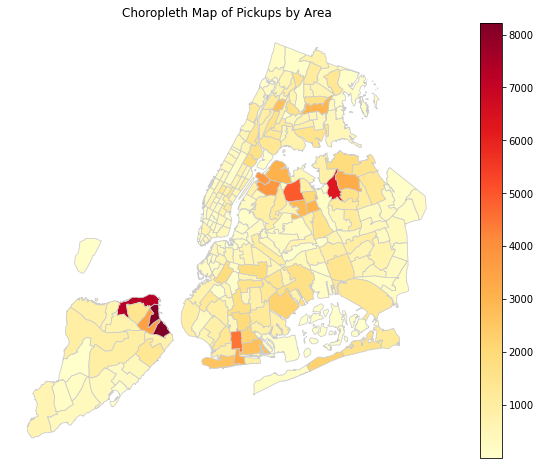

In [137]:
pickup_counts = dffhv42021.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [138]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dffhv42021.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()

#### Le mois avril 2022:

1.1.Heatmap where color is a function of number of pickups:

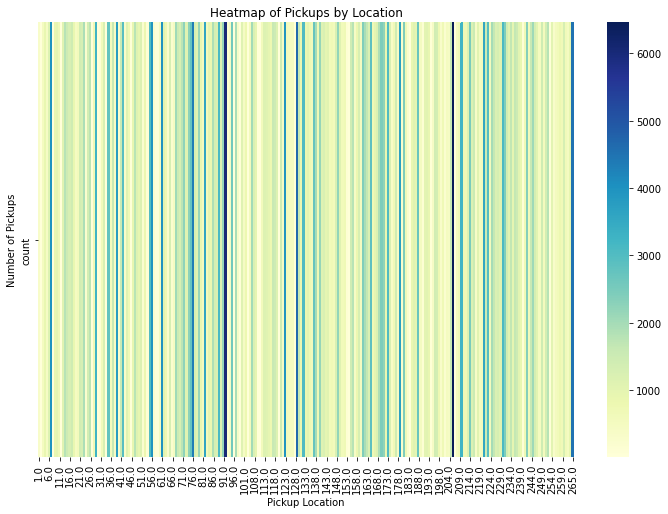

In [139]:
pickup_counts = dffhv42022.groupBy('PULocationID').count()
pickup_counts_pd = pickup_counts.toPandas()
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups by Location')
plt.show()

1.2.Heatmap where color is a function of number of dropoffs:

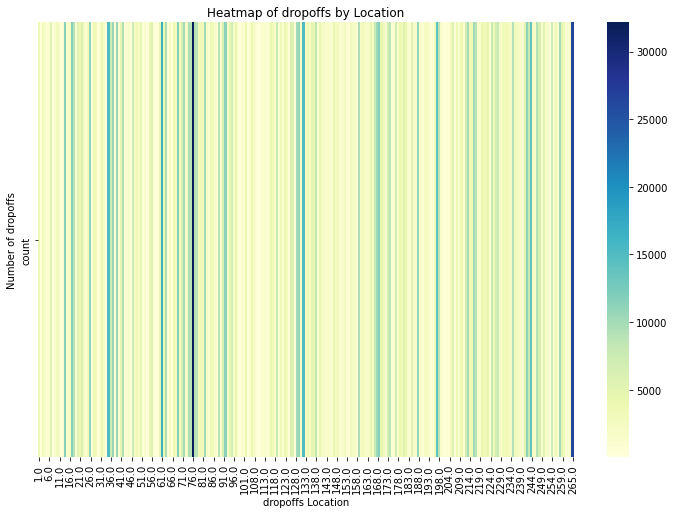

In [140]:
dropoffs_counts = dffhv42022.groupBy('DOLocationID').count()
dropoffs_counts_pd = dropoffs_counts.toPandas()
heatmap_data = dropoffs_counts_pd.pivot_table(index=None, columns='DOLocationID', values='count')
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlGnBu', cbar=True)
plt.xlabel('dropoffs Location')
plt.ylabel('Number of dropoffs')
plt.title('Heatmap of dropoffs by Location')
plt.show()

1.3.Heatmap where color is a function of number of pickups with dropoff at some airport (JFK, LaGuardia, Newark):

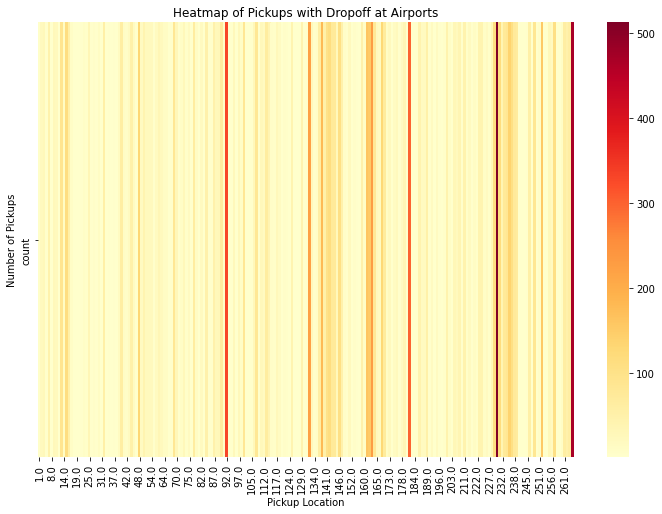

In [141]:
#Filter the DataFrame to include only the rows where the dropoff location (DOLocationID) matches the airport IDs (JFK, LaGuardia, Newark)

airport_pickups = dffhv42022.filter(dffhv42022.DOlocationID.isin([132, 138, 1]))

#Group the filtered data by pickup location (PULocationID) and count the number of pickups in each location
pickup_counts = airport_pickups.groupBy('PULocationID').count()

#Convert the PySpark DataFrame to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

#Create a pivot table to reshape the data for the heatmap
heatmap_data = pickup_counts_pd.pivot_table(index=None, columns='PULocationID', values='count')

#Plot the heatmap using Seaborn
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='YlOrRd', cbar=True)
plt.xlabel('Pickup Location')
plt.ylabel('Number of Pickups')
plt.title('Heatmap of Pickups with Dropoff at Airports')
plt.show()

2.1.A choropeth map where color is a function of number of pickups in the area:

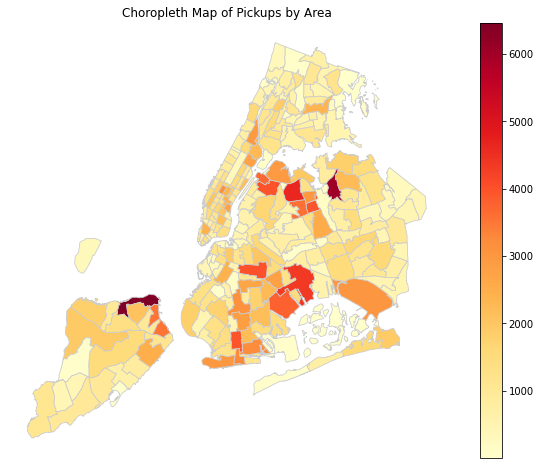

In [142]:
pickup_counts = dffhv42022.groupBy('PULocationID').count()
# Convert pickup_counts to a Pandas DataFrame
pickup_counts_pd = pickup_counts.toPandas()

# Merge the geographic boundary data with the pickup counts
joined_data = boundary_data.merge(pickup_counts_pd, left_on='LocationID', right_on='PULocationID', how='left')

# Create the choropleth map
fig, ax = plt.subplots(figsize=(12, 8))
joined_data.plot(column='count', cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)
ax.set_axis_off()
plt.title('Choropleth Map of Pickups by Area')
plt.show()

3.1.An interactive chorophet where the color is a function of average number of dropoffs in the area during that hour the day

In [143]:
# Calculate the average number of dropoffs in each area for each hour of the day
average_dropoffs = dffhv42020.groupBy('DOLocationID', 'hour_of_day').agg(fn.avg('dropoff_time').alias('average_dropoffs'))

# Convert the PySpark DataFrame to a Pandas DataFrame for visualization
average_dropoffs_pd = average_dropoffs.toPandas()

# Create a choropleth map using the average dropoffs and hour of day
fig = go.Figure(data=go.Choropleth(
    locations=average_dropoffs_pd['DOLocationID'],
    z=average_dropoffs_pd['average_dropoffs'],
    locationmode='USA-states',
    colorscale='Viridis',
    colorbar=dict(title='Average Dropoffs'),
    marker_line_color='white',
    zmin=0,
    zmax=average_dropoffs_pd['average_dropoffs'].max(),
))

# Configure the layout of the figure
fig.update_layout(
    title_text='Average Dropoffs by Hour of Day',
    geo=dict(
        scope='usa',
        center=dict(lat=40.7128, lon=-74.0060),
        projection_type='albers usa'
    ),
    
    height=600,
    width=800,
    sliders=[
        {
            'currentvalue': {'prefix': 'Hour: '},
            'steps': [{'label': f'{hour}', 'method': 'update', 'args': [{'z': [average_dropoffs_pd.loc[average_dropoffs_pd["hour_of_day"] == hour, "average_dropoffs"]]}]} for hour in average_dropoffs_pd['hour_of_day'].unique()],
        }
    ],
)

# Show the figure
fig.show()